In [1]:
from matplotlib.scale import FuncScale
from matplotlib.ticker import FuncFormatter
from matplotlib.ticker import MaxNLocator
from matplotlib.colors import Normalize
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scipy.sparse
import scipy.stats as stats
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, KNNImputer
from sklearn.ensemble import RandomForestRegressor

df = pd.read_csv('developer_dataset.csv', low_memory=False)

In [2]:
df.describe(include='all')

,RespondentID,Year,Country,Employment,UndergradMajor,DevType,LanguageWorkedWith,LanguageDesireNextYear,DatabaseWorkedWith,DatabaseDesireNextYear,...,PlatformDesireNextYear,Hobbyist,OrgSize,YearsCodePro,JobSeek,ConvertedComp,WorkWeekHrs,NEWJobHunt,NEWJobHuntResearch,NEWLearn
count,111209.000000,111209.000000,111209,109425,98453,100433,102018,96044,85859,74234,...,85376,68352,54804,94793.000000,60556,9.133300e+04,51089.000000,19127,18683,24226
unique,NaN,NaN,9,7,19,15627,33037,36490,7936,8558,...,16024,2,10,NaN,3,NaN,NaN,1751,63,4
top,NaN,NaN,United States,Employed full-time,"Computer science, computer engineering, or sof...","Developer, full-stack",C#;HTML/CSS;JavaScript;SQL,Python,MySQL,PostgreSQL,...,Linux,Yes,20 to 99 employees,NaN,"I’m not actively looking, but I am open to new...",NaN,NaN,Curious about other opportunities;Better compe...,"Read company media, such as employee blogs or ...",Once a year
freq,NaN,NaN,53727,84707,60852,6814,1071,1263,5850,4474,...,4343,54733,10516,NaN,33943,NaN,NaN,548,1319,9312
mean,19262.039709,2018.854832,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,9.547045,NaN,1.251777e+05,41.051670,NaN,NaN,NaN
std,11767.011322,0.777503,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,7.548931,NaN,2.461218e+05,13.833929,NaN,NaN,NaN
min,1.000000,2018.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.000000,NaN,0.000000e+00,1.000000,NaN,NaN,NaN
25%,9268.000000,2018.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,4.000000,NaN,4.600000e+04,40.000000,NaN,NaN,NaN
50%,18535.000000,2019.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,8.000000,NaN,7.900000e+04,40.000000,NaN,NaN,NaN
75%,28347.000000,2019.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,14.000000,NaN,1.200000e+05,42.000000,NaN,NaN,NaN


In [3]:
# set better column names for my own benefit
df.columns = [
    'respondent_id', 'year', 'country', 'employment', 'undergrad',
    'devtype', 'language', 'future_language', 'db_exp', 'future_db', 'platform',
    'future_platform', 'hobbyist', 'orgsize', 'exp', 'jobseek',
    'income', 'hours', 'newjobhunt', 'newjobhuntresearch', 'newlearn'
]

In [4]:
df.head(20)

,respondent_id,year,country,employment,undergrad,devtype,language,future_language,db_exp,future_db,...,future_platform,hobbyist,orgsize,exp,jobseek,income,hours,newjobhunt,newjobhuntresearch,newlearn
0,1,2018,United States,Employed full-time,"Computer science, computer engineering, or sof...",Engineering manager;Full-stack developer,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,141000.0,NaN,NaN,NaN,NaN
1,1,2019,United States,Employed full-time,"Computer science, computer engineering, or sof...","Developer, full-stack",C;C++;C#;Python;SQL,C;C#;JavaScript;SQL,MySQL;SQLite,MySQL;SQLite,...,Linux;Windows,No,100 to 499 employees,1.0,I am not interested in new job opportunities,61000.0,80.0,NaN,NaN,NaN
2,1,2020,United States,Employed full-time,"Computer science, computer engineering, or sof...",NaN,HTML/CSS;Ruby;SQL,Java;Ruby;Scala,MySQL;PostgreSQL;Redis;SQLite,MySQL;PostgreSQL,...,Docker;Google Cloud Platform;Heroku;Linux;Windows,Yes,NaN,8.0,NaN,NaN,NaN,NaN,NaN,Once a year
3,2,2018,United States,Employed full-time,"Computer science, computer engineering, or sof...",Full-stack developer,C#;JavaScript;SQL;TypeScript;HTML;CSS;Bash/Shell,C#;JavaScript;SQL;TypeScript;HTML;CSS;Bash/Shell,"SQL Server;Microsoft Azure (Tables, CosmosDB, ...","SQL Server;Microsoft Azure (Tables, CosmosDB, ...",...,Azure,NaN,NaN,4.0,NaN,48000.0,NaN,NaN,NaN,NaN
4,2,2019,United States,Employed full-time,"Computer science, computer engineering, or sof...",Data or business analyst;Database administrato...,Bash/Shell/PowerShell;HTML/CSS;JavaScript;PHP;...,Bash/Shell/PowerShell;HTML/CSS;JavaScript;Rust...,Couchbase;DynamoDB;Firebase;MySQL,Firebase;MySQL;Redis,...,Android;AWS;Docker;IBM Cloud or Watson;Linux;S...,Yes,10 to 19 employees,8.0,I am not interested in new job opportunities,90000.0,40.0,NaN,NaN,NaN
5,2,2020,United States,Employed full-time,"Computer science, computer engineering, or sof...","Developer, back-end;Developer, desktop or ente...",Python;SQL,JavaScript,MariaDB;MySQL;Redis,MongoDB,...,iOS;Slack Apps and Integrations,Yes,20 to 99 employees,13.0,"I’m not actively looking, but I am open to new...",116000.0,39.0,Curious about other opportunities;Better compe...,"Read company media, such as employee blogs or ...",Once a year
6,3,2018,United States,Employed full-time,"Computer science, computer engineering, or sof...",Back-end developer;Front-end developer;Full-st...,JavaScript;HTML;CSS,C;Go;JavaScript;Python;HTML;CSS,MongoDB,NaN,...,Linux,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
7,3,2019,United States,Employed full-time,NaN,"Data or business analyst;Designer;Developer, b...",Bash/Shell/PowerShell;C++;HTML/CSS;JavaScript;...,Bash/Shell/PowerShell;C++;HTML/CSS;JavaScript;...,Elasticsearch;MySQL;Oracle;Redis,Elasticsearch;MySQL;Oracle;Redis,...,Docker;Linux;Raspberry Pi;Windows,Yes,"10,000 or more employees",18.0,"I’m not actively looking, but I am open to new...",103000.0,40.0,NaN,NaN,NaN
8,3,2020,United States,Employed full-time,"Computer science, computer engineering, or sof...","Developer, desktop or enterprise applications;...",HTML/CSS;JavaScript;SQL;TypeScript,HTML/CSS;JavaScript;SQL;TypeScript,Firebase;Microsoft SQL Server,Firebase;Microsoft SQL Server,...,Google Cloud Platform;Raspberry Pi;Windows,Yes,100 to 499 employees,1.0,"I’m not actively looking, but I am open to new...",66000.0,40.0,Wanting to share accomplishments with a wider ...,"Read company media, such as employee blogs or ...",Every few months
9,4,2018,United States,Employed full-time,Fine arts or performing arts (ex. graphic desi...,"Back-end developer;C-suite executive (CEO, CTO...",Assembly;CoffeeScript;Erlang;Go;JavaScript;Lua...,Erlang;Go;Python;Rust;SQL,Redis;PostgreSQL;Amazon DynamoDB;Apache HBase;...,Redis;PostgreSQL;Amazon DynamoDB;Apache Hive;A...,...,AWS;Linux;Mac OS;Serverless,NaN,NaN,16.0,NaN,58000.0,NaN,NaN,NaN,NaN


In [5]:
# the plan: (this has been and will continue to be edited)

# ---id columns, will be used to keep data intact---
# 'respondent_id' - - - update: vestigial, dropping full column, must have been index for individual year survey
# 'year' - is clean - split df into df_year later
    # all of 'hours' is nan for observations in 2018
    # a significant amount of exp and income data is missing from 2018
    # the exp and income data that not missing has a very different shape than that of 2019 and 2020
        # going to check this out with some data vis and decide what to do from there
            # 2018 will be dropped from the set.

            # CODECADEMY INDICATED the DATASET provided for this project has been MODIFIED FROM
            # its ORIGINAL form from stack overflow, but they DID NOT SPECIFY HOW. i am betting
            # this is one (two?, three?) of the ways the dataset was modified before it got into my hands

# ---single attribute columns---
# 'country' - is clean
# 'employment' - fillna "No Employment Status Indicated" - nans have correlation with country, fillna with string to preserve observations
# 'undergrad' - fillna "No Undergraduate Degree Indicated" - reasoning: this is the most honest representation of the nan values

# ---multi-attribute columns---
# 'devtype' - split, consolidate duplicates, binarize
# 'language' - split, consolidate duplicates, binarize
# 'db_exp' - split, consolidate duplicates, binarize
# 'platform' - split, consolidate duplicates, binarize

# ---these are the columns i am interested in working on---
# 'hours' - impute na - logic: this value exists whether it is reported or not. graph original vs imputed on same axes to show difference
    # to note, all 2018 observations contained nan values in the 'hours' column, more 2018 shenanigans.
# 'exp' - impute na - logic: this value exists whether it is reported or not. graph original vs imputed on same axes to show difference
# 'income' - impute na - logic: this value exists whether it is reported or not. graph original vs imputed on same axes to show difference

In [6]:
# checking to see if respondent_id can be compared across years
respondent_counts_per_year = df.groupby('year')['respondent_id'].nunique()
print(respondent_counts_per_year)

observations_per_year = df.groupby('year').size()

for year, num_observations in observations_per_year.items():
    respondent_id_counts_this_year = df[df['year'] == year]['respondent_id'].value_counts()
    exceeding_ids = respondent_id_counts_this_year[respondent_id_counts_this_year > num_observations]

    if not exceeding_ids.empty:
        print(f"{year}: respondent id/s present outside number of respondents")
        print(exceeding_ids)
    else:
        print(f"{year}: number of respondents equals largest respondent id")

year
2018    42857
2019    41639
2020    26713
Name: respondent_id, dtype: int64
2018: number of respondents equals largest respondent id
2019: number of respondents equals largest respondent id
2020: number of respondents equals largest respondent id


In [7]:
# since there are no respondent ids greater than 26713 recorded in 2020 this tells me that respondent id cannot be used
# to compare an individual's data year over year, respondent id appears to be the unique identifier within each year's
# dataset, so that will just be replaced by an index once the frame is split into 3. we will drop this column

In [8]:
df.drop(columns=[
    'future_language', 'future_db', 'future_platform',
    'newjobhunt', 'newjobhuntresearch', 'newlearn',
    'jobseek', 'hobbyist', 'orgsize', 'respondent_id'
], inplace=True)

In [9]:
columns_ordered = [
    'year',
    'country',
    'employment',
    'undergrad',
    'devtype',
    'language',
    'db_exp',
    'platform',
    'hours',
    'exp',
    'income',
]
df = df[columns_ordered]

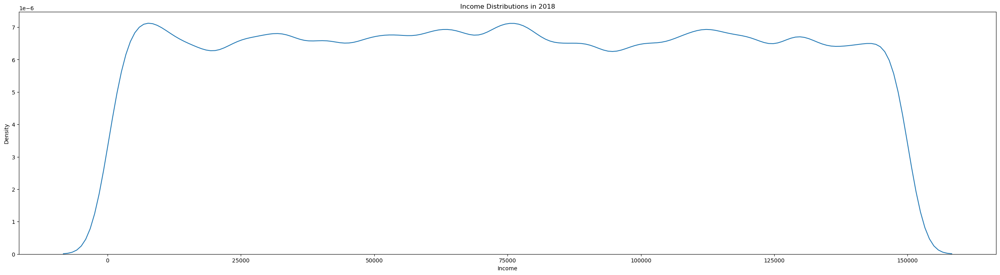

In [10]:
# farther down in this document i realize that much of the data that i am most interested in exploring is either
# missing from 2018 observations (in the case of 'hours') or appears to be randomly generated filler data. i am
# confirming this here before any transformations happen to 'exp' or 'income'.

df_2018 = df[df.year == 2018]

fig, ax = plt.subplots(figsize=(32, 8))
sns.kdeplot(
    data=df_2018,
    x=df_2018['income'],
    ax=ax,
    bw_adjust=0.5
)
ax.set_title(f'Income Distributions in 2018')
ax.set_xlabel('Income')
ax.set_ylabel('Density')

plt.show()

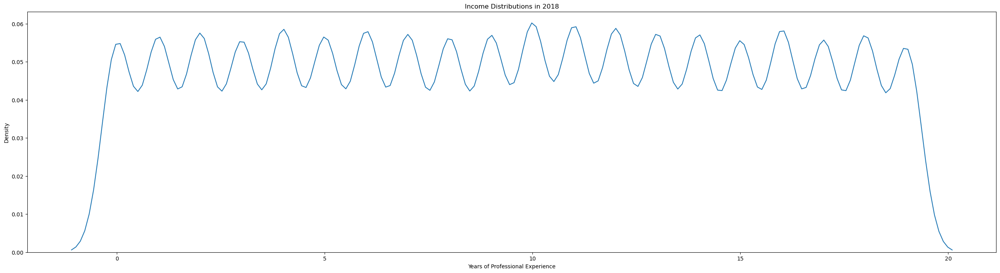

In [11]:
# this appears to just be a block of filler data. i expect the same in exp in df_2018
fig, ax = plt.subplots(figsize=(32, 8))
sns.kdeplot(
    data=df_2018,
    x=df_2018['exp'],
    ax=ax,
    bw_adjust=0.5
)
ax.set_title(f'Income Distributions in 2018')
ax.set_xlabel('Years of Professional Experience')
ax.set_ylabel('Density')

plt.show()

In [12]:
# dropping 2018 data
df = df[df.year >= 2019].copy().reset_index(drop=True)

In [13]:
# df.country.unique()
# 'country' is already clean

In [14]:
# df.undergrad.unique()

In [15]:
# df.employment.unique()

In [16]:
# cleanup dictionary to make consolidate duplicate valuesthis easier to chart later
undergrad_cleanup_dict = {
    'Computer science, computer engineering, or software engineering': 'Computer Science/Engineering',
    'Fine arts or performing arts (ex. graphic design, music, studio art)': 'Fine Arts/Performing Arts',
    'Fine arts or performing arts (such as graphic design, music, studio art, etc.)': 'Fine Arts/Performing Arts',
    'Information systems, information technology, or system administration': 'Information Systems/IT',
    'A humanities discipline (such as literature, history, philosophy, etc.)': 'Humanities',
    'A humanities discipline (ex. literature, history, philosophy)': 'Humanities',
    'A social science (ex. anthropology, psychology, political science)': 'Social Science',
    'A social science (such as anthropology, psychology, political science, etc.)': 'Social Science',
    'Web development or web design': 'Web Development/Design',
    'Another engineering discipline (ex. civil, electrical, mechanical)': 'Other Engineering',
    'Another engineering discipline (such as civil, electrical, mechanical, etc.)': 'Other Engineering',
    'Mathematics or statistics': 'Mathematics/Statistics',
    'A natural science (such as biology, chemistry, physics, etc.)': 'Natural Science',
    'A natural science (ex. biology, chemistry, physics)': 'Natural Science',
    'A business discipline (ex. accounting, finance, marketing)': 'Business',
    'A business discipline (such as accounting, finance, marketing, etc.)': 'Business',
    'I never declared a major': 'No major declared',
    'A health science (ex. nursing, pharmacy, radiology)': 'Health Science',
    'A health science (such as nursing, pharmacy, radiology, etc.)': 'Health Science'
}

In [17]:
# handling nan values in undergrad column - reasoning: this is the most honest representation of the nan values
df.undergrad = df.undergrad.fillna('No Undergrad Indicated').astype(pd.StringDtype())

# applying the dictionary to consolidate/clean the undergrad column
df.undergrad = df.undergrad.replace(undergrad_cleanup_dict)

In [18]:
# df.undergrad.unique()

In [19]:
# some of these are just a bit long, so modifying for charting purposes for later
employment_cleanup_dict = {
    'Employed full-time': 'Full-time',
    'Employed part-time': 'Part-time',
    'Independent contractor, freelancer, or self-employed': 'Freelance/Self-employed',
    'Not employed, but looking for work': 'Unemployed, Seeking',
    'Not employed, and not looking for work': 'Unemployed, Not Seeking',
}

In [20]:
# 'employment' appears to be a very amero-centric concept, there is a high correlationd
# between employment nan-values and non-US countries, so i will preserve these observations with "No Employment Status Indicated"
df.employment = df.employment.fillna("No Employment Indicated").astype(pd.StringDtype())
df.employment = df.employment.replace(employment_cleanup_dict)
# the employment column isnt as precise as 'hours' worked per week, but there is a relationship between the two columns, and that
# relationship should provide better context for imputing missing values in both 'hours', 'exp', and 'income'

In [21]:
df.devtype.unique()

array(['Developer, full-stack', nan,
       'Data or business analyst;Database administrator;Developer, back-end;Developer, desktop or enterprise applications;Developer, front-end;Developer, full-stack;Developer, mobile;DevOps specialist;Engineer, data;Engineer, site reliability;Engineering manager;Senior executive/VP;System administrator',
       ...,
       'Developer, front-end;Developer, game or graphics;System administrator',
       'Developer, back-end;Developer, desktop or enterprise applications;Developer, front-end;Developer, mobile;Product manager',
       'Designer;Developer, embedded applications or devices;Developer, front-end;Developer, full-stack;Developer, mobile;Product manager;Student'],
      dtype=object)

In [22]:
df.language.unique()

array(['C;C++;C#;Python;SQL', 'HTML/CSS;Ruby;SQL',
       'Bash/Shell/PowerShell;HTML/CSS;JavaScript;PHP;SQL;TypeScript',
       ...,
       'Bash/Shell/PowerShell;C;HTML/CSS;Java;JavaScript;Python;R;SQL;VBA',
       'Bash/Shell/PowerShell;C#;F#;Go;HTML/CSS;Java;JavaScript;Kotlin;Objective-C;PHP;Rust;Scala;SQL;Swift;TypeScript',
       'Assembly;Bash/Shell/PowerShell;Dart;Go;HTML/CSS;Java;JavaScript;Kotlin;TypeScript'],
      dtype=object)

In [23]:
df.db_exp.unique()

array(['MySQL;SQLite', 'MySQL;PostgreSQL;Redis;SQLite',
       'Couchbase;DynamoDB;Firebase;MySQL', ...,
       'Cassandra;Microsoft SQL Server;Oracle;SQLite',
       'Cassandra;Couchbase;DynamoDB;Firebase;Microsoft SQL Server;PostgreSQL;SQLite;Other(s):',
       'Cassandra;Couchbase;MySQL;Oracle;Redis'], dtype=object)

In [24]:
df.platform.unique()

array(['Linux;Windows', 'AWS;Docker;Linux;MacOS;Windows',
       'Android;AWS;Docker;IBM Cloud or Watson;iOS;Linux;MacOS;Microsoft Azure;Slack;Windows;WordPress',
       ...,
       'Android;AWS;Docker;Google Cloud Platform;Heroku;iOS;MacOS;WordPress',
       'Android;iOS;MacOS;Other(s):',
       'IBM Cloud or Watson;iOS;Linux;MacOS;Slack;Windows'], dtype=object)

In [25]:
# these columns appear to contain lists of skills, i want to take these apart and see how these skills
# are listed so i can collect all the unique values and make sure there are no accidental duplicates
# or typos

In [26]:
# defining list of columns that would benefit from splitting and/or being formatted as a list for binarizing later
columns_to_split = [
    'devtype',
    'language',
    'db_exp',
    'platform'
]

In [27]:
def split_into_list(df, column):
    df[column] = df[column].fillna('No ' + column + ' noted')
    df[column] = df[column].astype(pd.StringDtype())
    df[column] = df[column].str.split(';')
    return df

# splitting columns
for column in columns_to_split:
    df = split_into_list(df, column)

In [28]:
column = 'devtype'
exploded_series = df[column].explode()
value_counts = exploded_series.value_counts()
print(f"\nValue counts for '{column}':\n")
print(value_counts)

devtype_unique = exploded_series.unique().tolist()


Value counts for 'devtype':

devtype
Developer, full-stack                            32494
Developer, back-end                              29588
Developer, front-end                             19491
Developer, desktop or enterprise applications    13168
Developer, mobile                                 8754
No devtype noted                                  8422
DevOps specialist                                 7554
Database administrator                            7007
System administrator                              6965
Designer                                          6360
Developer, embedded applications or devices       5442
Developer, QA or test                             4907
Data scientist or machine learning specialist     4894
Data or business analyst                          4806
Engineer, data                                    4691
Student                                           4437
Engineering manager                               3830
Academic researcher        

In [29]:
column = 'language'
exploded_series = df[column].explode()
value_counts = exploded_series.value_counts()
print(f"\nValue counts for '{column}':\n")
print(value_counts)

language_unique = exploded_series.unique().tolist()


Value counts for 'language':

language
JavaScript               45139
HTML/CSS                 41797
SQL                      36440
Python                   30953
Bash/Shell/PowerShell    28333
Java                     25393
C#                       21089
TypeScript               15466
C++                      14934
PHP                      14737
C                        12510
Go                        6946
Ruby                      6635
Swift                     4467
R                         4340
Kotlin                    4220
VBA                       4214
Other(s):                 4196
Assembly                  4159
Rust                      3431
Objective-C               3024
Scala                     2834
No language noted         2348
Dart                      1430
Perl                      1007
Clojure                    743
Elixir                     696
Haskell                    664
WebAssembly                537
F#                         515
Erlang                     382

In [30]:
column = 'db_exp'
exploded_series = df[column].explode()
value_counts = exploded_series.value_counts()
print(f"\nValue counts for '{column}':\n")
print(value_counts)

db_exp_unique = exploded_series.unique().tolist()


Value counts for 'db_exp':

db_exp
MySQL                   27235
PostgreSQL              20588
Microsoft SQL Server    18594
SQLite                  16310
MongoDB                 13385
No db_exp noted         12467
Redis                   11074
Elasticsearch            8679
MariaDB                  8557
Oracle                   7828
Firebase                 5578
DynamoDB                 4624
Other(s):                2748
Cassandra                1952
Couchbase                1166
IBM DB2                   611
Name: count, dtype: int64


In [31]:
column = 'platform'
exploded_series = df[column].explode()
value_counts = exploded_series.value_counts()
print(f"\nValue counts for '{column}':\n")
print(value_counts)

platform_unique = exploded_series.unique().tolist()


Value counts for 'platform':

platform
Linux                          33848
Windows                        30348
Docker                         22575
AWS                            18958
MacOS                          16651
Android                        13110
Raspberry Pi                   11195
Microsoft Azure                 8546
iOS                             8214
Slack                           8124
Google Cloud Platform           7927
WordPress                       7435
No platform noted               7082
Kubernetes                      7017
Heroku                          6311
Arduino                         6059
Slack Apps and Integrations     1942
Other(s):                       1516
IBM Cloud or Watson             1057
Name: count, dtype: int64


In [32]:
# binarizing attribute columns
columns_to_binarize = [
    'devtype',
    'language',
    'db_exp',
    'platform',
]
# instantiate ohe
ohe = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# columns_to_binarize is defined above, before the split function
for column in columns_to_binarize:
    exploded_series = df[column].explode()
    encoded_data = ohe.fit_transform(exploded_series.values.reshape(-1, 1))
    encoded_df = pd.DataFrame(encoded_data, columns=ohe.get_feature_names_out([column]))
    encoded_df_grouped = encoded_df.groupby(exploded_series.index).max().reset_index(drop=True)
    df = df.join(encoded_df_grouped)

# create lists of new column names for future reference
devtype_columns = [col for col in df.columns if col.startswith('devtype_')]
language_columns = [col for col in df.columns if col.startswith('language_')]
db_exp_columns = [col for col in df.columns if col.startswith('db_exp_')]
platform_columns = [col for col in df.columns if col.startswith('platform_')]

binary_attributes = devtype_columns + language_columns + db_exp_columns + platform_columns

In [33]:
# df.describe(include='all')

In [34]:
# now that the categorical columns are cleaned up a bit i want to address hours, exp, and income

In [35]:
# checking to see what percentage of income is nan values
percentage_nan = df['income'].isnull().mean() * 100

print(f"percentage of 'income' observations that are nan: {percentage_nan:.2f}%")

percentage of 'income' observations that are nan: 9.93%


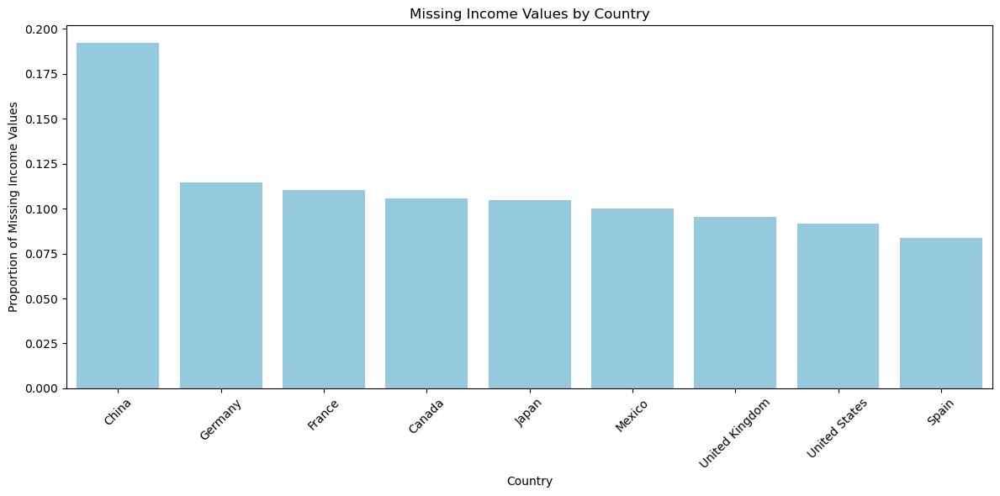

In [36]:
# if there is a relationship between country and income, how about
# countries compared by frequency of no value reported for income?
missingness_by_country = df.groupby('country')['income'].apply(lambda x: x.isnull().mean()).reset_index()

missingness_by_country.columns = ['country', 'missingness_proportion']

missingness_by_country = missingness_by_country.sort_values(by='missingness_proportion', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x='country', y='missingness_proportion', data=missingness_by_country, color='skyblue')
plt.xlabel('Country')
plt.ylabel('Proportion of Missing Income Values')
plt.title('Missing Income Values by Country')

plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [37]:
# exploring missingness of 'income', 'exp', and 'hours' data
missingness_df = df[['income', 'exp', 'hours']].isnull().astype(int)
# crosstab on three columns
def crosstab_and_chi2_three_columns(df):
    contingency_table = pd.crosstab([df['income'], df['exp']], df['hours'])
    chi2, p, dof, expected = stats.chi2_contingency(contingency_table)

    print("Contingency Table:\n", contingency_table)
    print("\nChi-squared Test Results:")
    print("Chi-squared Statistic:", chi2)
    print("p-value:", p)
    print("Degrees of Freedom:", dof)

crosstab_and_chi2_three_columns(missingness_df)

Contingency Table:
 hours           0     1
income exp             
0      0    49227  9891
       1       46  2402
1      0     1811  3944
       1        5  1026

Chi-squared Test Results:
Chi-squared Statistic: 17882.210987949584
p-value: 0.0
Degrees of Freedom: 3


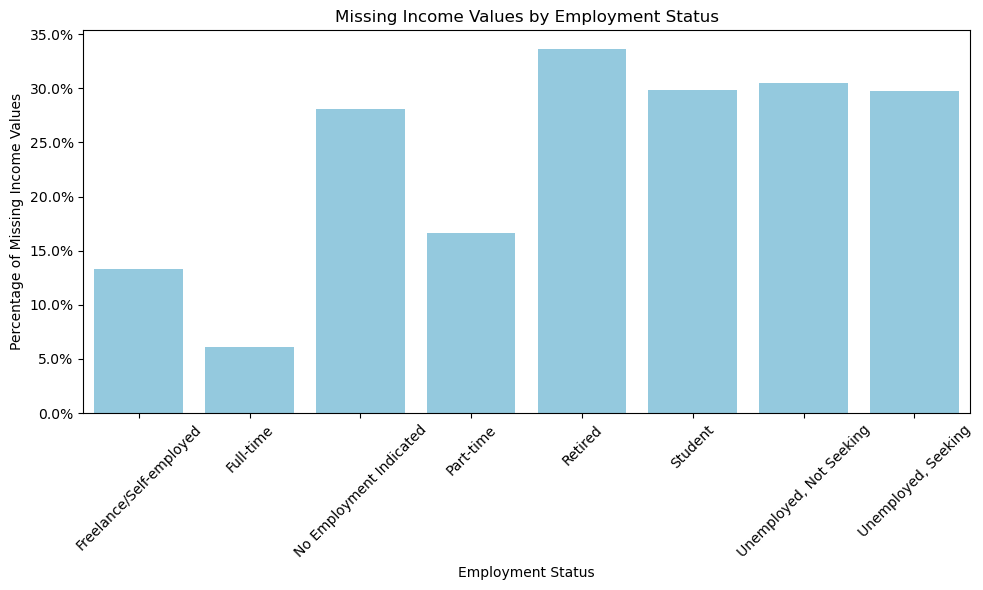

In [38]:
missingness_by_employment = df.groupby('employment')['income'].apply(lambda x: x.isnull().mean()).reset_index()

# rename columns for clarity
missingness_by_employment.columns = ['Employment Status', 'Missingness Proportion']

# create bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
sns.barplot(x='Employment Status', y='Missingness Proportion', data=missingness_by_employment, color='skyblue')

# labels, title, format y-axis as percentage
plt.xlabel('Employment Status')
plt.ylabel('Percentage of Missing Income Values')
plt.title('Missing Income Values by Employment Status')
plt.xticks(rotation=45)  

# format y ticks to show percentages
formatter = FuncFormatter(lambda y, pos: f'{y*100:.1f}%')
plt.gca().yaxis.set_major_formatter(formatter)

plt.tight_layout()
plt.show()

In [39]:
# of all employment types full-time is most likely to include an income value, while retired is least likely to
# include an income value full-time is also the only employment type that has a smaller ratio of nan values
# than the mean ratio of nan values across all employment types
# at this point it seems reasonable to drop employment types that are not 'Freelance/Self-employed',
# 'Full-time', or 'Part-time' as the difference in nan rate by employment values indicate a relationship
# of relative significance between an employment indicating no current job and and the presence of nan in income.
employed = [
    'Freelance/Self-employed',
    'Full-time',
    'Part-time',
]

df = df[df['employment'].isin(employed)].reset_index(drop=True)


# since there is such a high incidence of income being reported as nan for individuals who do not affirmatively
# indicate they have a job, i am making the assumption that these survey respondents might have reasonably
# assumeed, based on the presentation of the survey, that leaving income 'blank' (ie. nan) after not affirmatively
# indicating an 'employed' status was an effective and appropriate means of communicating zero income.

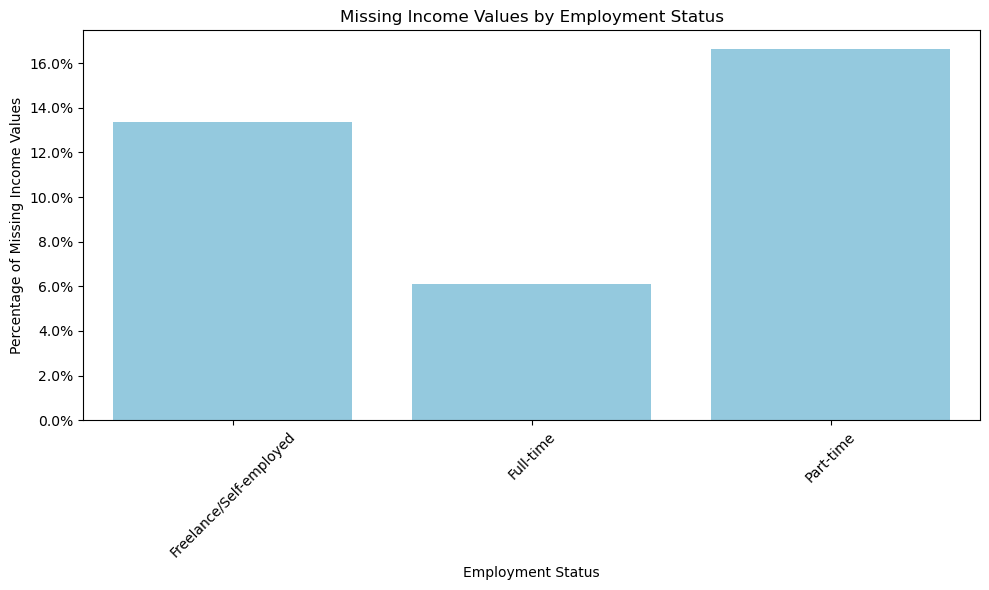

In [40]:
# re-plotting same chart after dropping rows not positively affirming employment in some capacity
missingness_by_employment = df.groupby('employment')['income'].apply(lambda x: x.isnull().mean()).reset_index()

# rename columns for clarity
missingness_by_employment.columns = ['Employment Status', 'Missingness Proportion']

# create bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
sns.barplot(x='Employment Status', y='Missingness Proportion', data=missingness_by_employment, color='skyblue')

# labels, title, format y-axis as percentage
plt.xlabel('Employment Status')
plt.ylabel('Percentage of Missing Income Values')
plt.title('Missing Income Values by Employment Status')
plt.xticks(rotation=45)  

# format y ticks to show percentages
formatter = FuncFormatter(lambda y, pos: f'{y*100:.1f}%')
plt.gca().yaxis.set_major_formatter(formatter)

plt.tight_layout()
plt.show()

In [41]:
# i will want to chart distribution of income by country, distribution of income by undergrad,
# distribution of income by employment, plot hours(x) against income(y), and plot exp(x) against income(y)

# income, exp, and hours all have significant outliers that are making charting further down frustrating
# i am addressing outliers here before any other modifications to these columns occur

# initially i winsorized these columns by clipping the rightmost data, but this had a cascading effect that i did not enjoy, so
# i have changed my mind, i am removing observations containing values greater than three sd over mean from income, exp, and hours

def remove_righthand_outliers_from_column_by_country(df, column, n_deviations):
    # create a list of frames by grouping df by country
    country_dfs = [group for _, group in df.groupby('country')]

    for i in range(len(country_dfs)):
        # set current df to work on
        country_df = country_dfs[i]
        # get mean, std from non-nans
        mean = country_df[column].mean(skipna=True)
        std = country_df[column].std(skipna=True)
        # handling potential division by zero just in case
        if pd.isna(std) or std == 0:
            print(f"Warning: Skipping outlier removal for '{column}' in country {country_df['country'].iloc[0]} due to insufficient data.")
            continue

        # set upper limit of to-keep
        threshold = mean + (n_deviations * std)

        # modify frame in list outside of for-loop
        country_dfs[i] = country_df.loc[(country_df[column] <= threshold) | country_df[column].isna()]

    # combine modified/trimmed frames back into a unified, slimmer frame
    clean_df = pd.concat(country_dfs)
    # return full dataframe to avoid any issues with combining columns where different rows might be missing from each
    return clean_df


columns_with_outliers = [
    'hours',
    'exp',
    'income'
]

# once i started plotting income distribution by country i realized outliers (and trends) should be addressed on
# a per country basis to avoid introducing an income bias by country, so i have modified this function to split
# the dataframe by country, apply the outlier protection to each country dataframe, and then put them all back together


for column in columns_with_outliers:
    df = remove_righthand_outliers_from_column_by_country(df, column, 3)

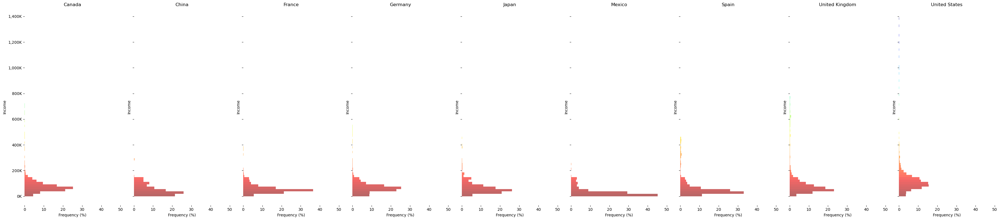

In [42]:
# plotting income by country now that ive handled outliers
country_list = df['country'].unique().tolist()

num_countries = len(country_list)
fig, axes = plt.subplots(nrows=1, ncols=num_countries, figsize=(4 * num_countries, 8), sharey=True)

min_income = df['income'].min()
max_income = df['income'].max()

num_bins = 75
palette = sns.color_palette("jet_r", n_colors=num_bins)

for i, country in enumerate(country_list):
    ax = axes[i]
    country_data = df[df['country'] == country]['income'].dropna()

    # histograms for charting
    counts, bin_edges = np.histogram(country_data, bins=num_bins, range=(min_income, max_income))

    # counts as percentages
    percentages = counts / counts.sum() * 100

    # need to define bar_widths
    bar_widths = np.diff(bin_edges)

    # plot horizontal bars
    for j in range(len(percentages)):
        ax.barh(bin_edges[j], percentages[j], height=bar_widths[j], align='edge', color=palette[j], alpha=0.6)

    # labels and title
    ax.set_xlabel('Frequency (%)')
    ax.set_ylabel('Income') 
    ax.set_title(f'{country}')

    # set x limits for all charts to make easy to compare
    ax.set_xlim(0, 50)

    # remove borders from individual charts
    for spine in ['top','right', 'bottom', 'left']:
        ax.spines[spine].set_visible(False)

    # set y ticks for all charts
    formatter = FuncFormatter(lambda y, pos: f'{int(y/1000):,}K')
    ax.yaxis.set_major_formatter(formatter)

plt.tight_layout()
plt.show()

In [43]:
df[df.income.isna()].describe(include='all')

,year,country,employment,undergrad,devtype,language,db_exp,platform,hours,exp,...,platform_MacOS,platform_Microsoft Azure,platform_No platform noted,platform_Other(s):,platform_Raspberry Pi,platform_Slack,platform_Slack Apps and Integrations,platform_Windows,platform_WordPress,platform_iOS
count,4215.000000,4215,4215,4215,4215,4215,4215,4215,1706.000000,3831.000000,...,4215.000000,4215.000000,4215.000000,4215.000000,4215.000000,4215.000000,4215.000000,4215.000000,4215.000000,4215.000000
unique,NaN,9,3,13,1406,2183,771,1320,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,United States,Full-time,Computer Science/Engineering,[No devtype noted],[No language noted],[No db_exp noted],[No platform noted],NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,1892,3133,2375,580,422,1027,729,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,2019.415896,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41.042145,10.135213,...,0.234164,0.103440,0.172954,0.017556,0.162040,0.105575,0.024199,0.416845,0.117675,0.123606
std,0.492934,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.854426,7.910233,...,0.423525,0.304569,0.378252,0.131348,0.368532,0.307330,0.153686,0.493095,0.322261,0.329171
min,2019.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2019.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.000000,4.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2019.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.000000,8.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2020.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.000000,15.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000


In [44]:
columns_to_analyze = [
    'year',
    'country',
    'employment',
    # 'undergrad',
]

# nan dict
nan_counts = {}

# get nan info for each column
for col in columns_to_analyze:
    grouped_df = df.groupby(col)['income'].agg(['count', 'size'])
    grouped_df['nan_count'] = grouped_df['size'] - grouped_df['count']
    grouped_df['nan_percentage'] = (grouped_df['nan_count'] / grouped_df['size']) * 100

    nan_counts[col] = grouped_df.reset_index()

# get nan info for combinations of columns
grouped_df = df.groupby(columns_to_analyze)['income'].agg(['count', 'size'])
grouped_df['nan_count'] = grouped_df['size'] - grouped_df['count']
grouped_df['nan_percentage'] = (grouped_df['nan_count'] / grouped_df['size']) * 100
nan_counts['combined'] = grouped_df.reset_index()


for key, value in nan_counts.items():
    print(f"\nNaN Counts for '{key}':\n")
    print(value.to_markdown(index=False, numalign="left", stralign="left"))


NaN Counts for 'year':

| year   | count   | size   | nan_count   | nan_percentage   |
|:-------|:--------|:-------|:------------|:-----------------|
| 2019   | 32499   | 34961  | 2462        | 7.04213          |
| 2020   | 19939   | 21692  | 1753        | 8.08132          |

NaN Counts for 'country':

| country        | count   | size   | nan_count   | nan_percentage   |
|:---------------|:--------|:-------|:------------|:-----------------|
| Canada         | 4146    | 4469   | 323         | 7.22757          |
| China          | 597     | 725    | 128         | 17.6552          |
| France         | 3217    | 3500   | 283         | 8.08571          |
| Germany        | 7367    | 8093   | 726         | 8.97072          |
| Japan          | 541     | 599    | 58          | 9.6828           |
| Mexico         | 938     | 1019   | 81          | 7.94897          |
| Spain          | 2210    | 2366   | 156         | 6.59341          |
| United Kingdom | 7605    | 8173   | 568         | 6.94

In [45]:
# iterativeimputer has been a huge headache, dropping binary encoded columns even with keep_empty_features=True
# in order to make use of iterativeimputer im going to have to let it impute values in to_impute with no
# automatic context from the columns in binary_attributes, but i can use my knowledge of existing relationships
# that columns like country and employment have with income to impute within a refined scope.

# iterative imputer continues to be a huge headache, this time with estimators. i am modifying this function
# so i can visualize the data produced by different estimators against eachother to compare the impact of choice
# of imputation technique on data generated.

# i am beginning to think iterativeimputer just was not meant for this dataset. all of the estimators produced the same
# data so i will need to do a deep dive on that another time to figure out what it is that im missing.

In [46]:
attributes = [
    'devtype',
    'language',
    'db_exp',
    'platform'
]

# creating guide columns to aid iterativeimputer. these are just counts of unique values
# submitted by each respondent for each attribute column
for column in attributes:
    df[f'num_{column}'] = df[column].str.len()

# create list of guide column names to pass to imputer
attributes_counts = [f'num_{column}' for column in attributes]

In [47]:
df[attributes_counts].describe(include='all')

,num_devtype,num_language,num_db_exp,num_platform
count,56653.000000,56653.000000,56653.000000,56653.000000
mean,2.967098,4.991880,2.420013,3.216176
std,2.305403,2.555168,1.649196,2.210948
min,1.000000,1.000000,1.000000,1.000000
25%,1.000000,3.000000,1.000000,1.000000
50%,2.000000,5.000000,2.000000,3.000000
75%,4.000000,6.000000,3.000000,4.000000
max,24.000000,28.000000,14.000000,16.000000


In [48]:
# defining lists of columns that will be referenced in each round of imputing to follow
impute_by = [
    'year',
    'country',
    # 'employment',
]

to_impute = [
    'hours',
    'exp',
    'income'
]

In [49]:
# separate functions by imputer
def impute_by_categorical_combinations_iterative(df, impute_by, to_impute, new_column_names, guide_columns=None):
    # create set of all unique combinations of unique values in impute_by
    combinations = df[impute_by].drop_duplicates().values

    # create empty list to hold subframes
    imputed_dfs = []

    # iterate over each combination
    for values in combinations:
        # create empty mask to be updated
        mask = pd.Series(True, index=df.index)
        # update empty mask with each instance of unique combo of values
        for col, val in zip(impute_by, values):
            mask &= (df[col] == val)

        # create subframe for current combination
        sub_df = df[mask].copy()

        # if rows exist in subframe, impute and append
        if not sub_df.empty:
            # instantiate scaler
            scaler = StandardScaler()
            # apply an automatic scaler to numeric columns to aid accuracy in imputing
            sub_df[to_impute] = scaler.fit_transform(sub_df[to_impute])

            # combine guide_columns and to_impute
            columns_to_use = guide_columns + to_impute

            # define estimator here
            estimator = RandomForestRegressor(
                n_estimators=100,
                max_depth=None,
                min_samples_split=2,
                min_samples_leaf=1,
                max_features='auto',
                random_state=0,
            )

            # instantiate imputer with estimator for each sub_df
            imputer = IterativeImputer(
                estimator=estimator,
                max_iter=150,
                initial_strategy='mean',
                imputation_order='random',
                random_state=0,
                missing_values=np.nan,
                keep_empty_features=True,
            )

            # save copy of guide columns to test later to ensure they remain unchanged
            # this is mostly for iterativeimputer, which cannot be trusted
            control = sub_df[guide_columns].copy()

            # impute missing values in the subframe
            sub_df[new_column_names] = imputer.fit_transform(sub_df[columns_to_use])[:, -len(to_impute):]

            # check control copy of columns against imputed and let me know if its going wrong. keep going though.
            if not (control.equals(sub_df[guide_columns])):
                print(f"Warning: Guide columns were modified during imputation for combination: {values}")

            # re-scale values of imputed columns. scaler retains context from .fit_transform() above to make .inverse_transform() easy
            sub_df[new_column_names] = scaler.inverse_transform(sub_df[new_column_names])
            imputed_dfs.append(sub_df)

    # concat all imputed subframes while maintaining original indexes
    df_imputed = pd.concat(imputed_dfs, ignore_index=False)

    return df_imputed[new_column_names]

In [50]:
# knnimputer to split df by year and country to impute from localized samples
def impute_by_categorical_combinations_knn(df, impute_by, to_impute, new_column_names, guide_columns=None):
    # all unique combinations of unique values in impute_by
    combinations = df[impute_by].drop_duplicates().values

    # empty list to hold subframes
    imputed_dfs = []

    # for each combination
    for values in combinations:
        # create empty mask to be updated
        mask = pd.Series(True, index=df.index)
        # update empty mask with each instance of unique combo of values
        for col, val in zip(impute_by, values):
            mask &= (df[col] == val)

        # create subframe for current combination
        sub_df = df[mask].copy()

        # if rows exist in subframe, impute and append
        if not sub_df.empty:
            # instantiate scaler
            scaler = StandardScaler()
            # apply an automatic scaler to numeric columns to aid accuracy in imputing
            sub_df[to_impute] = scaler.fit_transform(sub_df[to_impute])

            # knnimputer
            imputer = KNNImputer(
                n_neighbors = 5,
                missing_values=np.nan,
                keep_empty_features=True,
            )

            # impute using guide_columns (multi-label attributes) and to_impute for context
            sub_df[new_column_names] = imputer.fit_transform(sub_df[guide_columns + to_impute])[:, -len(to_impute):]

            # re-scale values of imputed columns
            sub_df[new_column_names] = scaler.inverse_transform(sub_df[new_column_names])
            imputed_dfs.append(sub_df)

    # concat all imputed subframes while maintaining original indexes
    df_imputed = pd.concat(imputed_dfs, ignore_index=False)

    return df_imputed[new_column_names]

In [51]:
# imputer: iterimp
# estimator: extratreesregressor

# new column names
columns_iterimp = [
    'iterhours',
    'iterexp',
    'iterincome',
]

df_iterimp = impute_by_categorical_combinations_iterative(
    df,
    impute_by,
    to_impute,
    columns_iterimp,
    guide_columns = binary_attributes,
)

df = df.join(df_iterimp)

In [52]:
# imputer: KNNImputer
# guide: binary attributes

# new column names
columns_knnimp = [
    'knnhours',
    'knnexp',
    'knnincome',
]

df_knnimp = impute_by_categorical_combinations_knn(
    df,
    impute_by,
    to_impute,
    columns_knnimp,
    guide_columns = binary_attributes,
)

df = df.join(df_knnimp)

In [53]:
# defining here to reference later
imputed_hours_columns = [
    'iterhours',
    'knnhours',
]
hours_columns = ['hours'] + imputed_hours_columns

imputed_exp_columns = [
    'iterexp',
    'knnexp',
]
exp_columns = ['exp'] + imputed_exp_columns

imputed_income_columns = [
    'iterincome',
    'knnincome',
]
income_columns = ['income'] + imputed_income_columns

# unified, ordered list of all the hours/exp/income columns
all_hours_exp_income = hours_columns + exp_columns + income_columns

In [54]:
 # creating copy of df as it is now before i trim it down
df_archive = df.copy()

In [55]:
# identifying columns and their order for new frames to be used in analysis. i just added 18 columns to
# the already lofty number of columns on the parent frame so bulking it down will speed up my next steps

categorical_columns = [
    'year',
    'country',
    'employment',
    'undergrad',
    'devtype',
    'language',
    'db_exp',
    'platform',
]

# identify the columns to keep for plotting
trimmed_columns = categorical_columns + all_hours_exp_income

# restrict df to only columns in trimmed_columns
df = df[trimmed_columns].copy().reset_index(drop=True)

# create subframes by years remaining in dataset (after rigorous cleaning it was determined that 2018 was a mess)
df_2019 = df[df['year'] == 2019].copy().reset_index(drop=True)
df_2020 = df[df['year'] == 2020].copy().reset_index(drop=True)

# add names to frames so they can be called while charting to make my life easier
df.name = '2019 and 2020'
df_2019.name = '2019'
df_2020.name = '2020'

In [56]:
# getting a general idea of the shape of this trimmed frame and to confirm the
# absence of nan values in the imputed columns
df[hours_columns].describe(include='all')

,hours,iterhours,knnhours
count,47595.000000,56653.000000,56653.000000
mean,40.302702,40.298735,40.248292
std,7.459541,6.857526,6.985862
min,1.000000,1.000000,1.000000
25%,40.000000,39.069973,39.000000
50%,40.000000,40.000000,40.000000
75%,42.000000,41.542105,42.000000
max,100.000000,100.000000,100.000000


In [57]:
df[exp_columns].describe(include='all')

,exp,iterexp,knnexp
count,55280.000000,56653.000000,56653.000000
mean,9.085564,9.082873,9.059619
std,7.511929,7.421938,7.442661
min,0.000000,0.000000,0.000000
25%,3.000000,3.000000,3.000000
50%,7.000000,7.000000,7.000000
75%,13.000000,13.000000,13.000000
max,36.000000,36.000000,36.000000


In [58]:
df[income_columns].describe(include='all')

,income,iterincome,knnincome
count,5.243800e+04,5.665300e+04,5.665300e+04
mean,1.032614e+05,1.029875e+05,1.025741e+05
std,1.240274e+05,1.196407e+05,1.203666e+05
min,0.000000e+00,-1.455192e-11,-1.455192e-11
25%,4.972500e+04,5.170400e+04,5.080600e+04
50%,7.850000e+04,7.957600e+04,7.850800e+04
75%,1.200000e+05,1.220000e+05,1.196000e+05
max,1.392000e+06,1.392000e+06,1.392000e+06


In [59]:
# after many attempts to tweak the scale of the x axis (along which i am plotting income) to create immediately
# informative visualizations of the true range of income, i have come to believe the only way to truely and
# informatively display the scale of the range of income is to do it on a linear scale with a wide-ass chart.

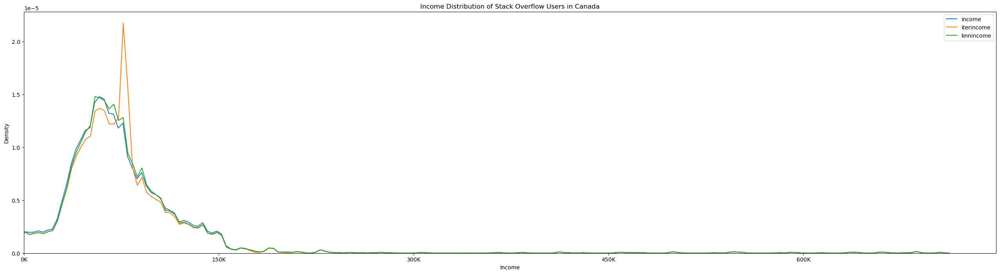

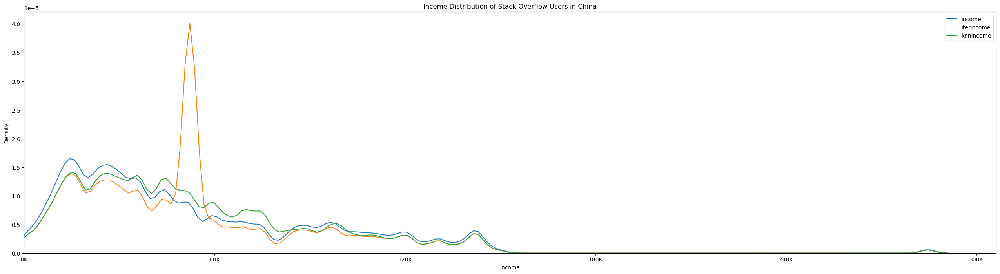

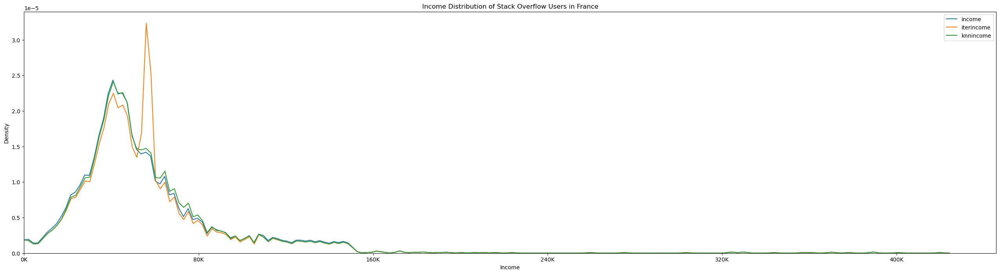

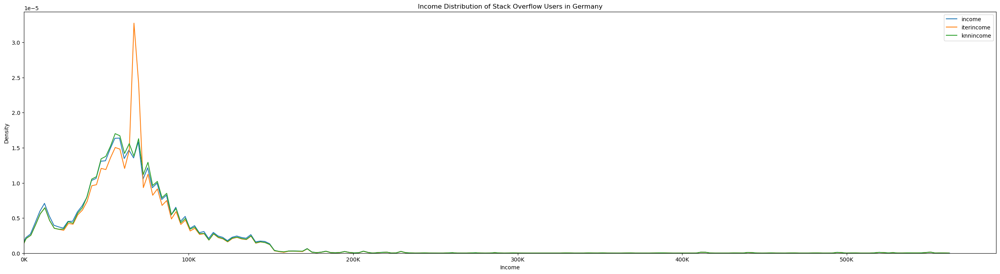

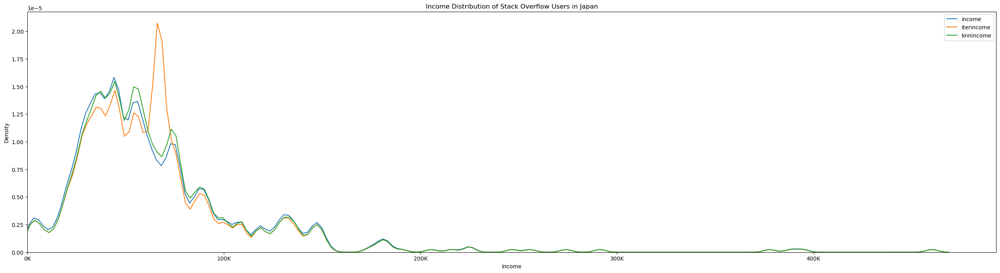

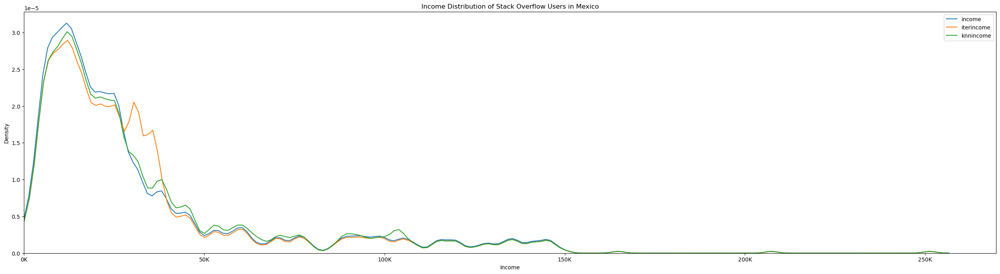

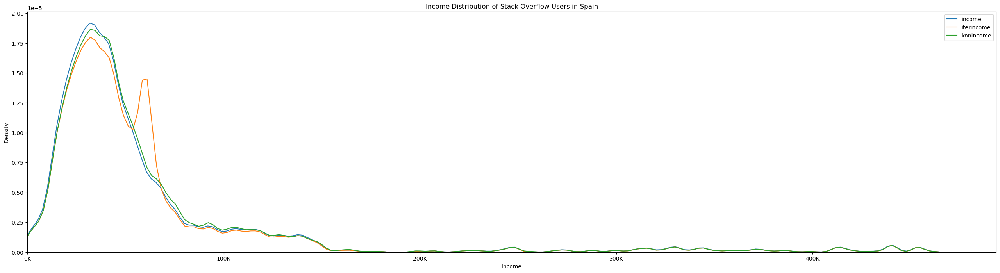

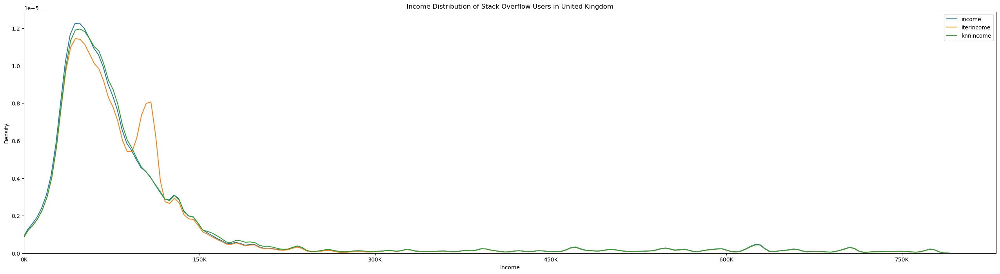

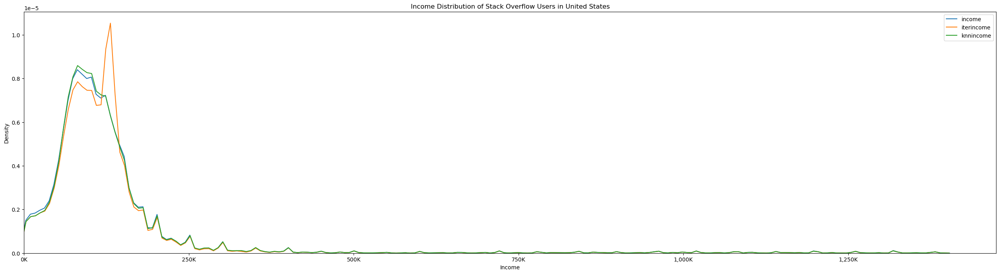

In [60]:
# here will will create an income distribution chart for each country present in the survey data.
# we will plot the kde/distribution of income and all imputed versions of income on the same set
# of axes to allow us to easily visually compare the results of different imputing estimators
# and executions

country_list = df['country'].unique().tolist()
for country in country_list:
    fig, ax = plt.subplots(figsize=(32, 8))

    country_data = df[df['country'] == country]
    for column in income_columns:
        sns.kdeplot(data=country_data, x=column, ax=ax, label=column, bw_adjust=0.2)

    ax.set_xlim(0, None)
    ax.set_ylim(0, None)
    ax.set_title(f'Income Distribution of Stack Overflow Users in {country}')
    ax.set_xlabel('Income')
    ax.set_ylabel('Density')

    ax.xaxis.set_major_locator(MaxNLocator(6))
    formatter = FuncFormatter(lambda x, pos: f'{int(x/1000):,}K')
    ax.xaxis.set_major_formatter(formatter)

    ax.legend()

    plt.show()

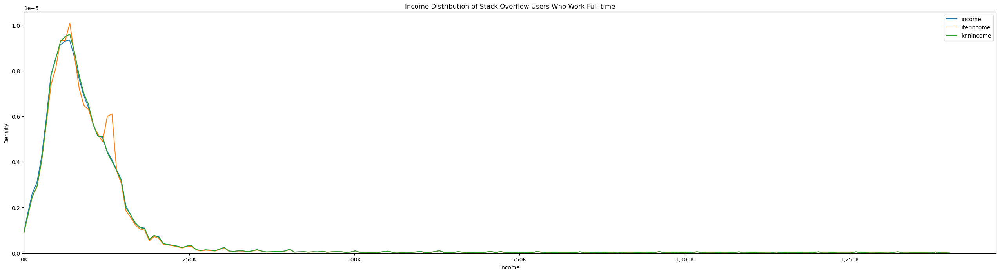

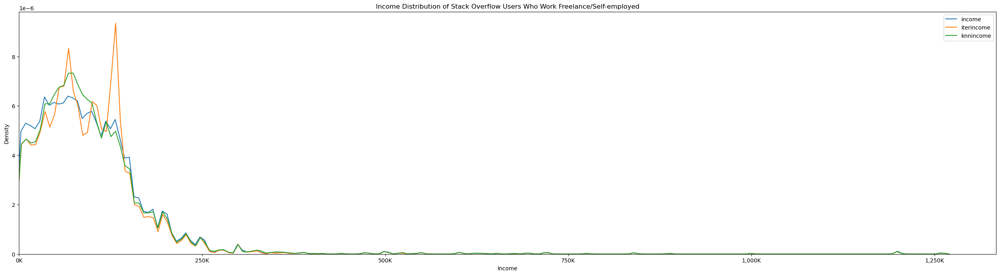

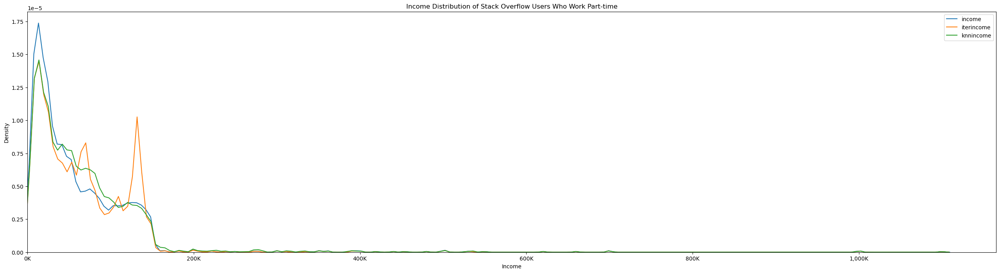

In [61]:
employment_list = df['employment'].unique().tolist()
for employment in employment_list:
    fig, ax = plt.subplots(figsize=(32, 8))

    employment_data = df[df['employment'] == employment]
    for column in income_columns:
        sns.kdeplot(data=employment_data, x=column, ax=ax, label=column, bw_adjust=0.2)

    ax.set_xlim(0, None)
    ax.set_ylim(0, None)
    ax.set_title(f'Income Distribution of Stack Overflow Users Who Work {employment}')
    ax.set_xlabel('Income')
    ax.set_ylabel('Density')

    ax.xaxis.set_major_locator(MaxNLocator(6))
    formatter = FuncFormatter(lambda x, pos: f'{int(x/1000):,}K')
    ax.xaxis.set_major_formatter(formatter)

    ax.legend()

    plt.show()

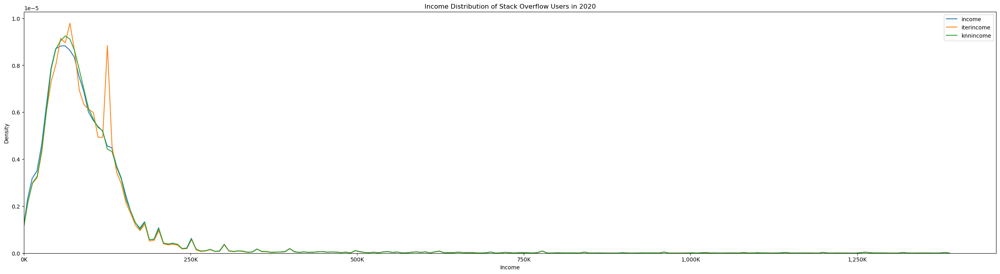

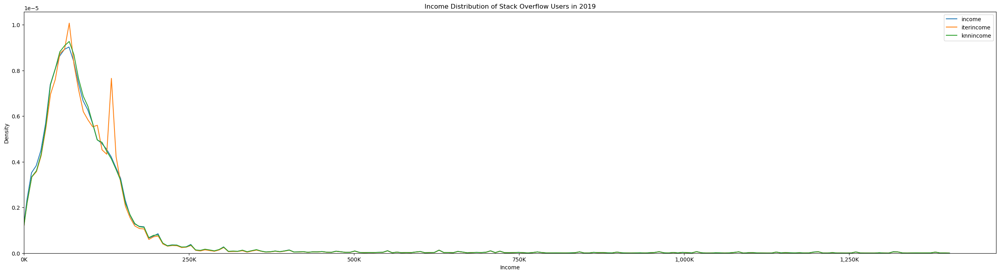

In [62]:
year_list = df['year'].unique().tolist()
for year in year_list:
    fig, ax = plt.subplots(figsize=(32, 8))

    year_data = df[df['year'] == year]
    for column in income_columns:
        sns.kdeplot(data=year_data, x=column, ax=ax, label=column, bw_adjust=0.2)

    ax.set_xlim(0, None)
    ax.set_ylim(0, None)
    ax.set_title(f'Income Distribution of Stack Overflow Users in {year}')
    ax.set_xlabel('Income')
    ax.set_ylabel('Density')

    ax.xaxis.set_major_locator(MaxNLocator(6))
    formatter = FuncFormatter(lambda x, pos: f'{int(x/1000):,}K')
    ax.xaxis.set_major_formatter(formatter)

    ax.legend()

    plt.show()

In [63]:
# i want to see income distribution by language, devtype, db_exp, and platform

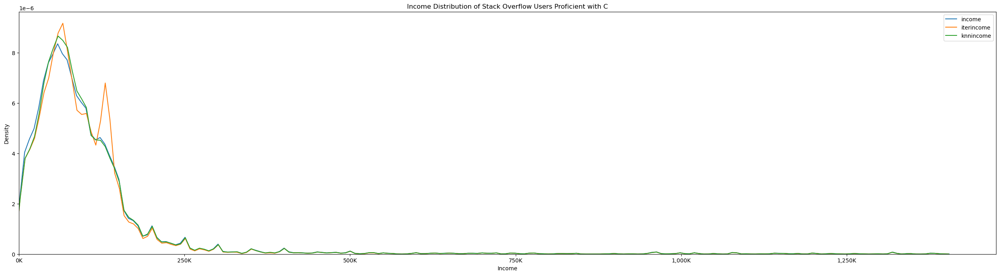

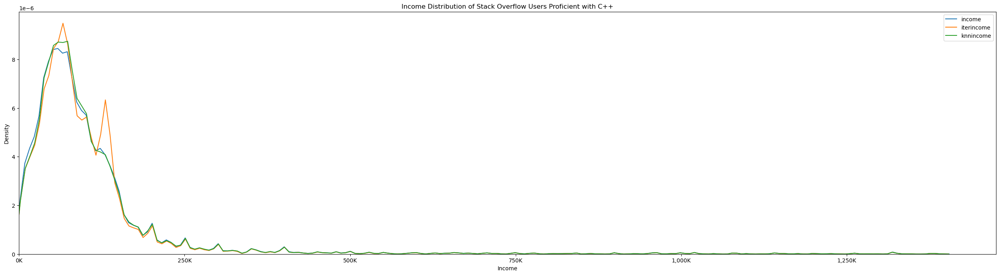

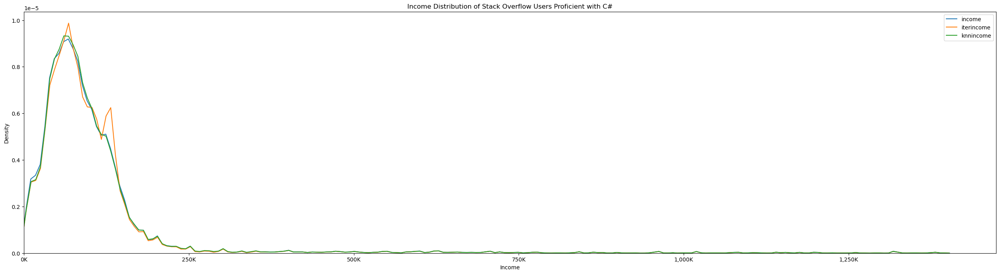

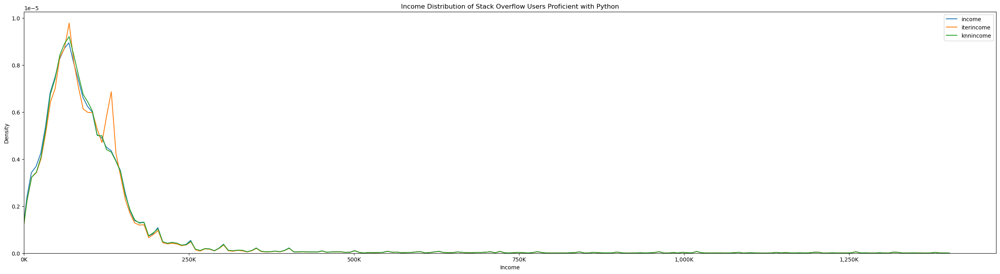

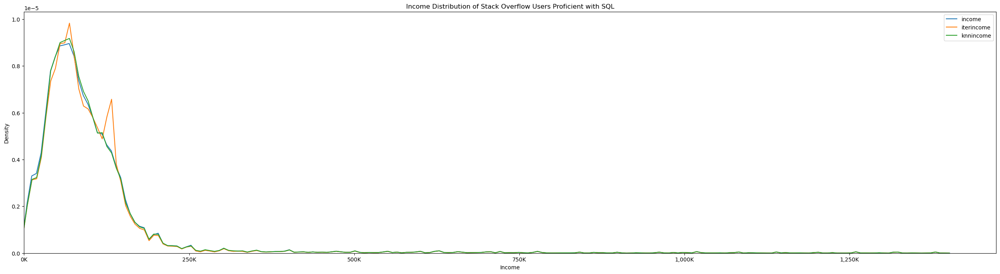

...

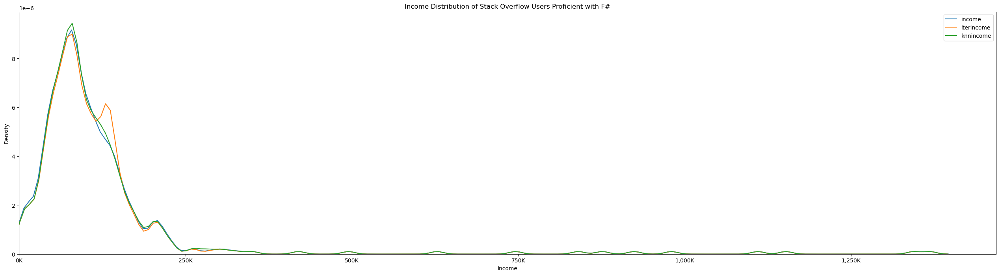

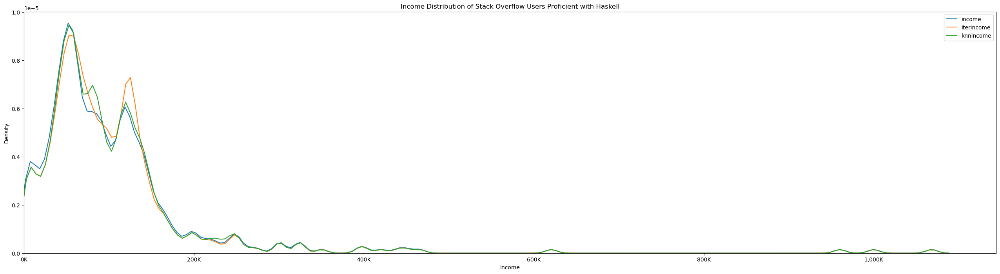

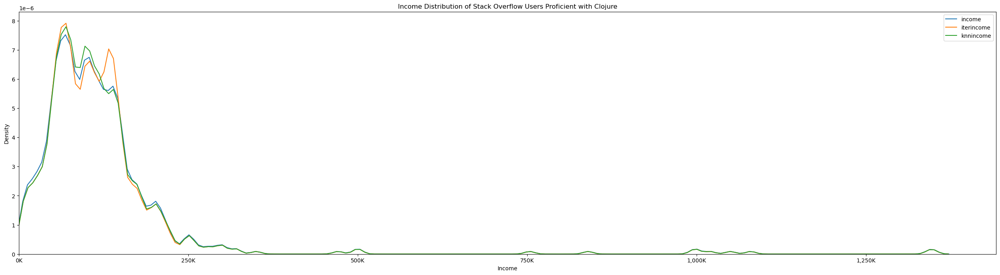

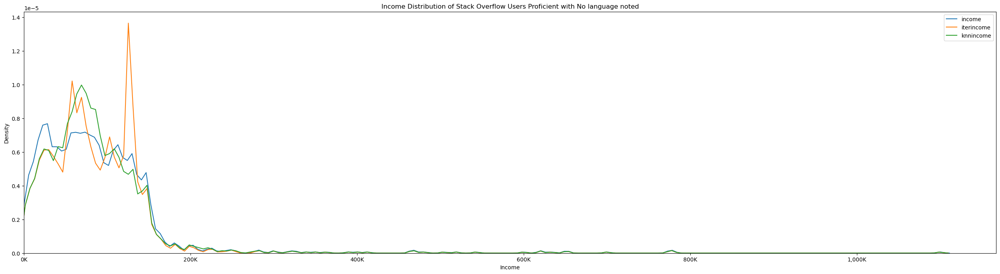

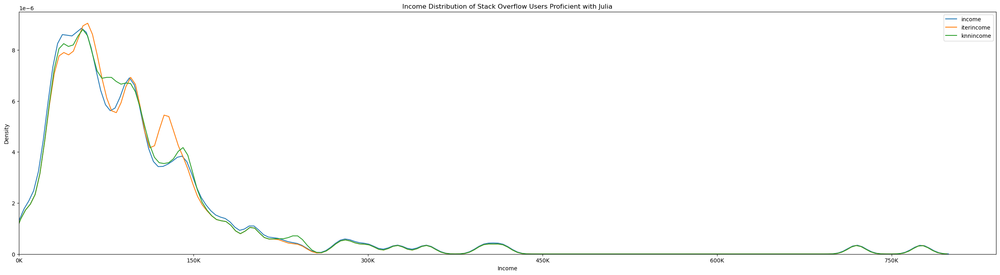

In [64]:
for language in language_unique:
    fig, ax = plt.subplots(figsize=(32, 8))

    language_data = df[df['language'].apply(lambda x: language in x)]
    for column in income_columns:
        sns.kdeplot(data=language_data, x=column, ax=ax, label=column, bw_adjust=0.2)

    ax.set_xlim(0, None)
    ax.set_ylim(0, None)
    ax.set_title(f'Income Distribution of Stack Overflow Users Proficient with {language}')
    ax.set_xlabel('Income')
    ax.set_ylabel('Density')

    ax.xaxis.set_major_locator(MaxNLocator(6))
    formatter = FuncFormatter(lambda x, pos: f'{int(x/1000):,}K')
    ax.xaxis.set_major_formatter(formatter)

    ax.legend()

    plt.show()

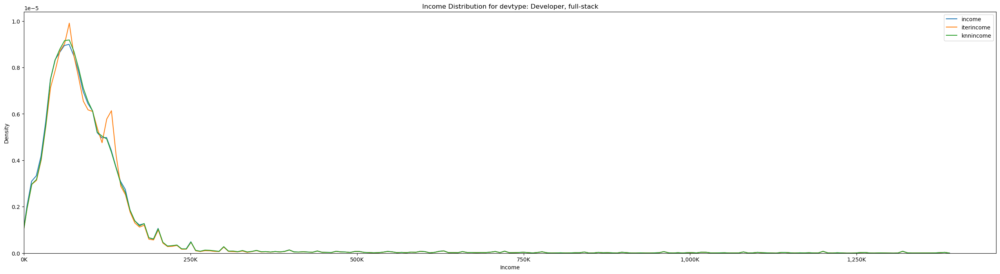

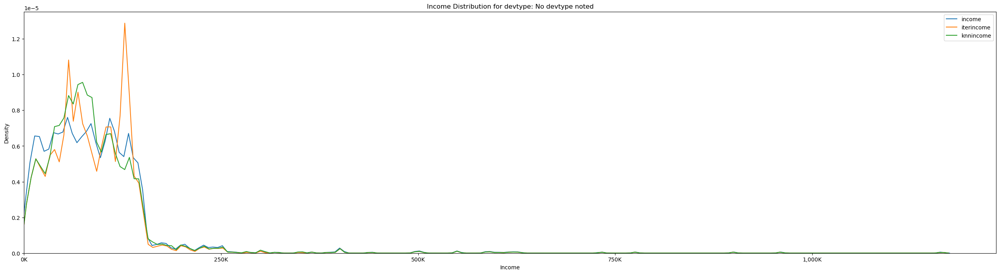

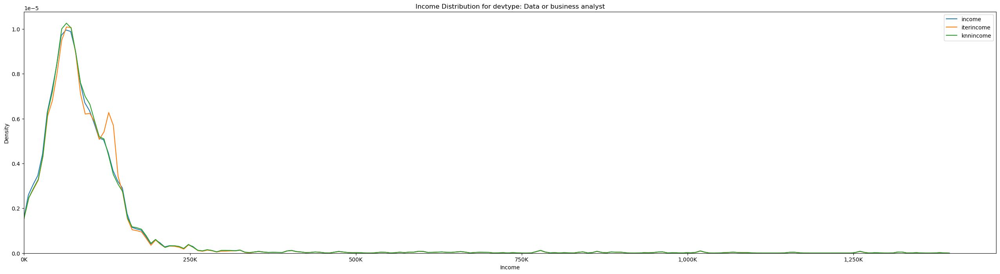

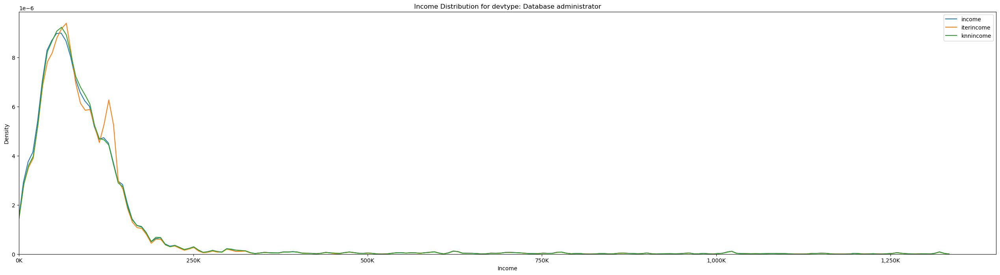

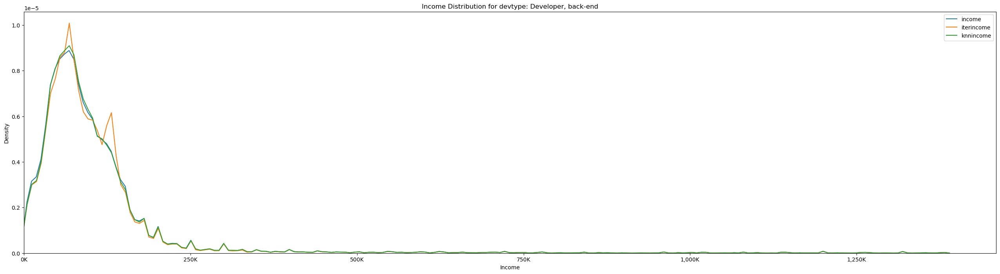

...

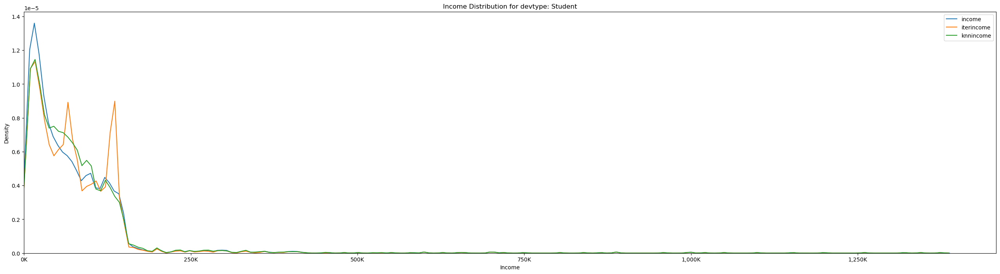

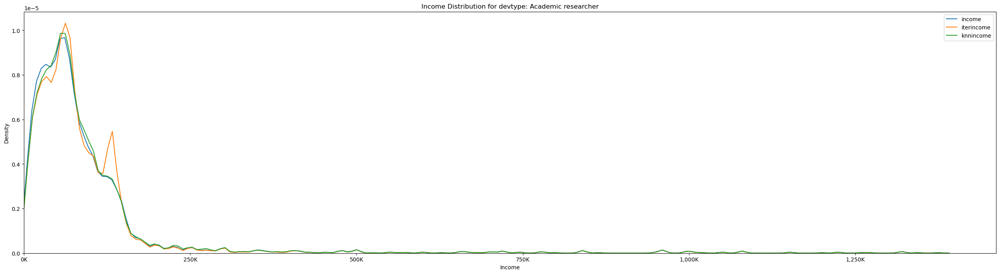

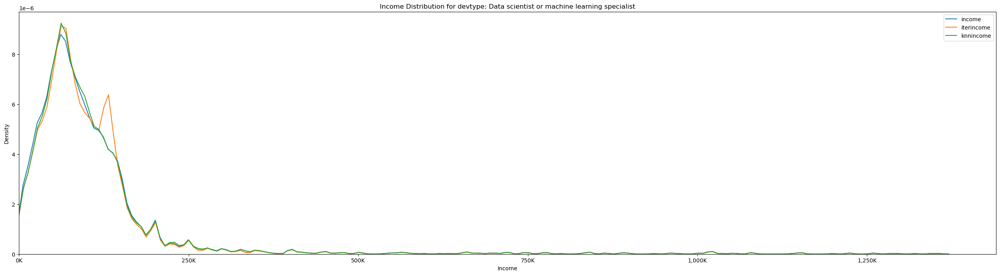

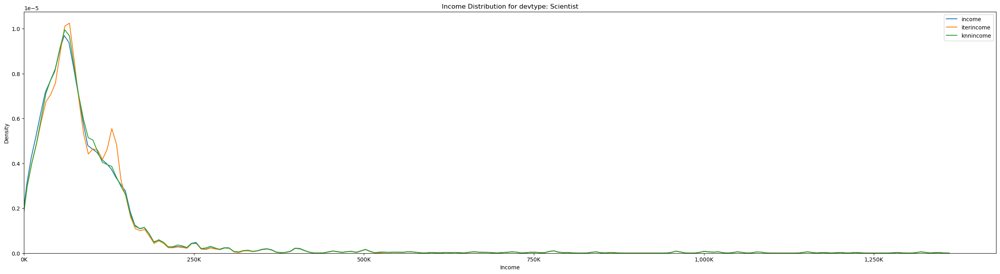

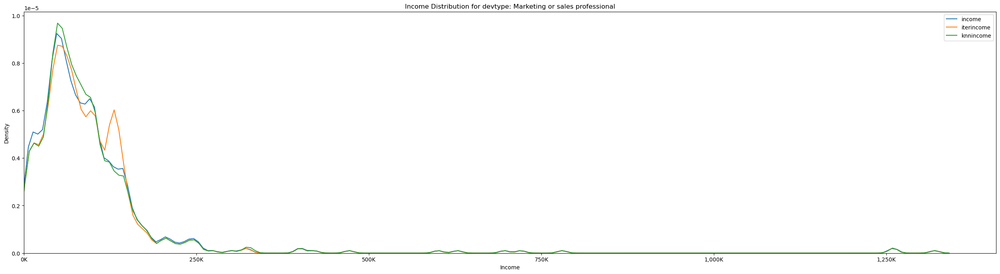

In [65]:
for devtype in devtype_unique:
    fig, ax = plt.subplots(figsize=(32, 8))

    devtype_data = df[df['devtype'].apply(lambda x: devtype in x)]
    for column in income_columns:
        sns.kdeplot(data=devtype_data, x=column, ax=ax, label=column, bw_adjust=0.2)

    ax.set_xlim(0, None)
    ax.set_ylim(0, None)
    ax.set_title(f'Income Distribution for devtype: {devtype}')
    ax.set_xlabel('Income')
    ax.set_ylabel('Density')

    ax.xaxis.set_major_locator(MaxNLocator(6))
    formatter = FuncFormatter(lambda x, pos: f'{int(x/1000):,}K')
    ax.xaxis.set_major_formatter(formatter)

    ax.legend()

    plt.show()

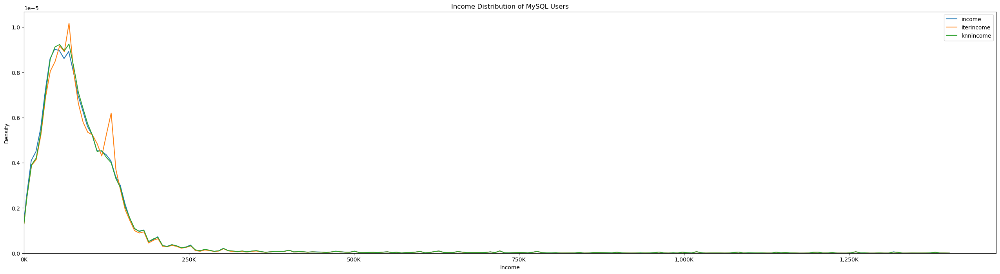

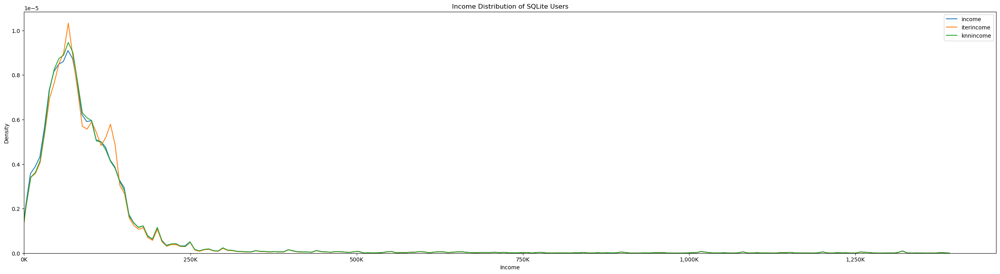

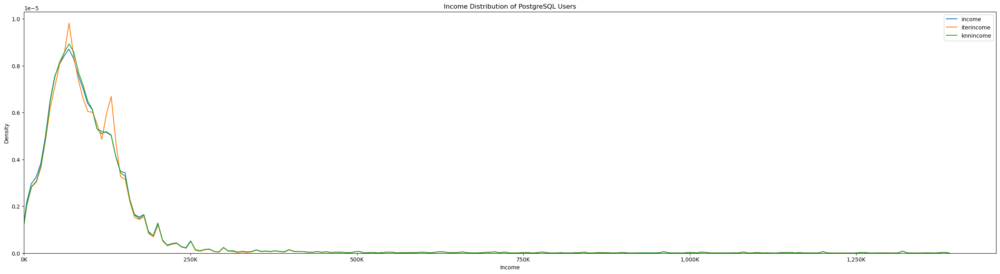

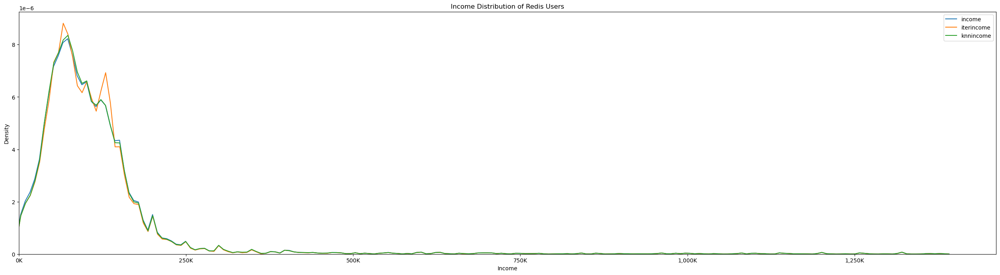

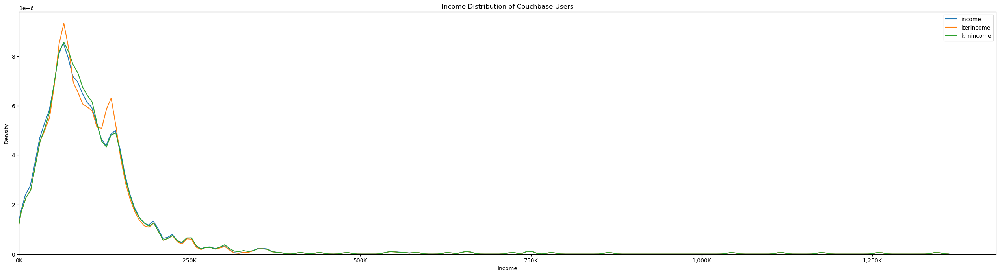

...

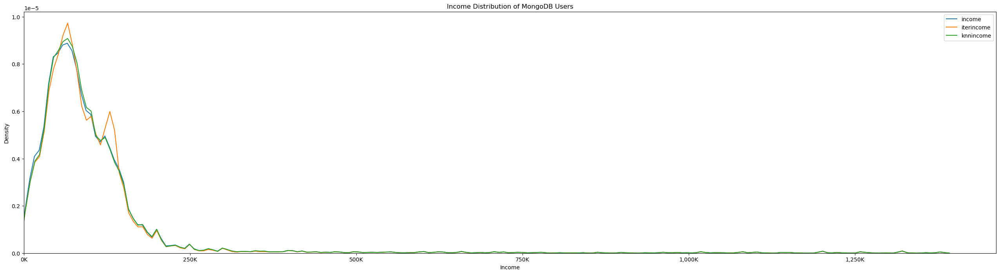

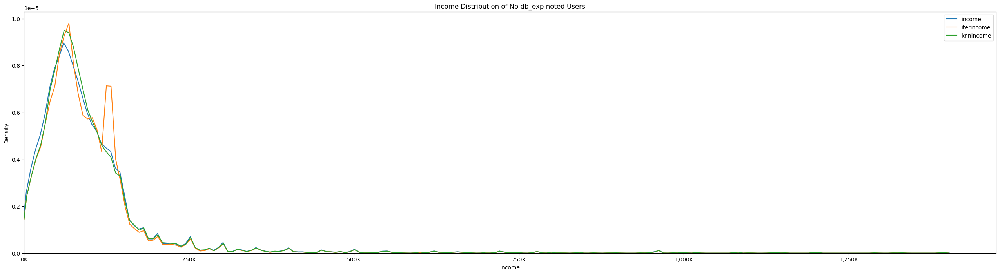

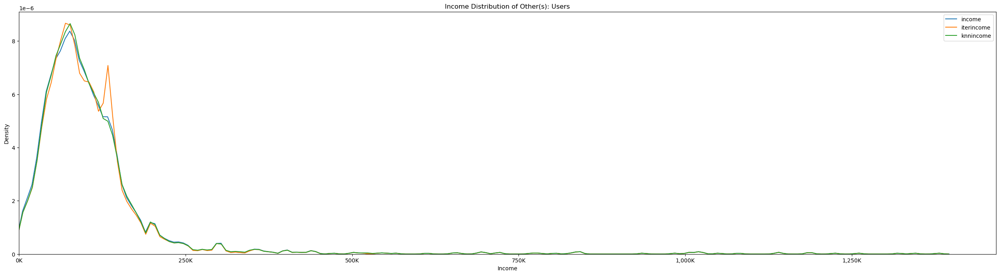

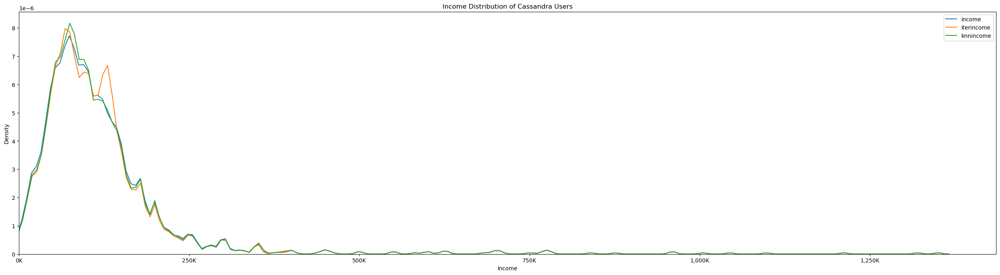

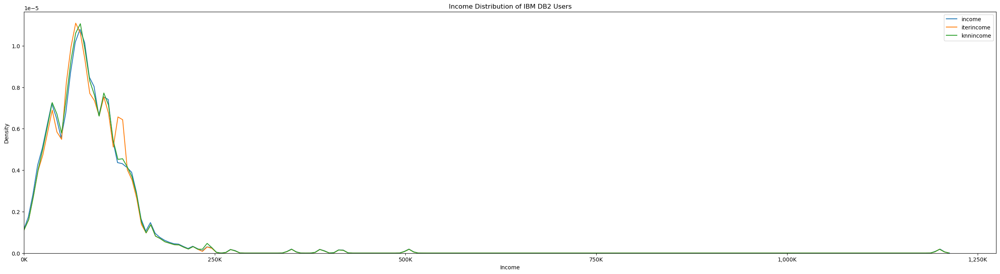

In [66]:
for db_exp in db_exp_unique:
    fig, ax = plt.subplots(figsize=(32, 8))

    db_exp_data = df[df['db_exp'].apply(lambda x: db_exp in x)]
    for column in income_columns:
        sns.kdeplot(data=db_exp_data, x=column, ax=ax, label=column, bw_adjust=0.2)

    ax.set_xlim(0, None)
    ax.set_ylim(0, None)
    ax.set_title(f'Income Distribution of {db_exp} Users')
    ax.set_xlabel('Income')
    ax.set_ylabel('Density')

    ax.xaxis.set_major_locator(MaxNLocator(6))
    formatter = FuncFormatter(lambda x, pos: f'{int(x/1000):,}K')
    ax.xaxis.set_major_formatter(formatter)

    ax.legend()

    plt.show()

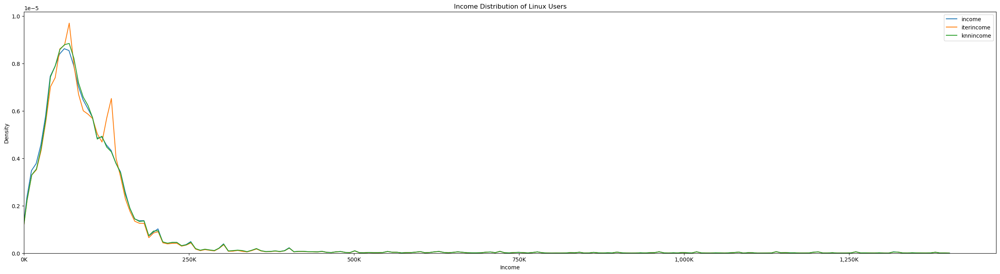

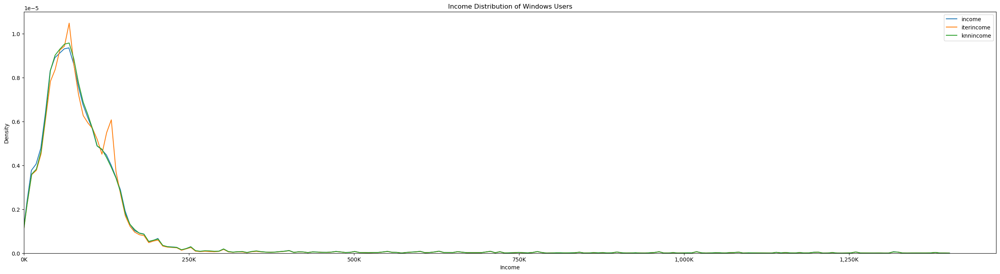

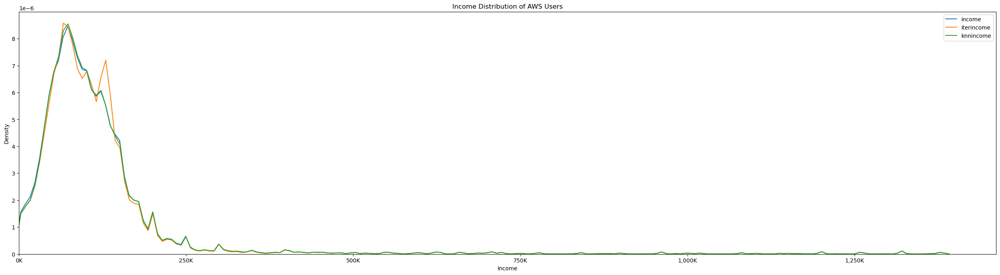

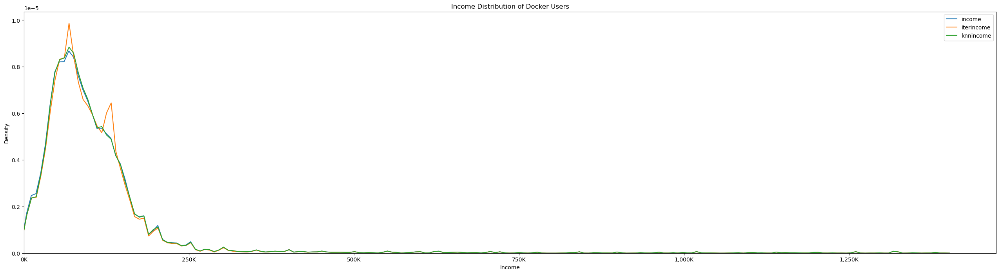

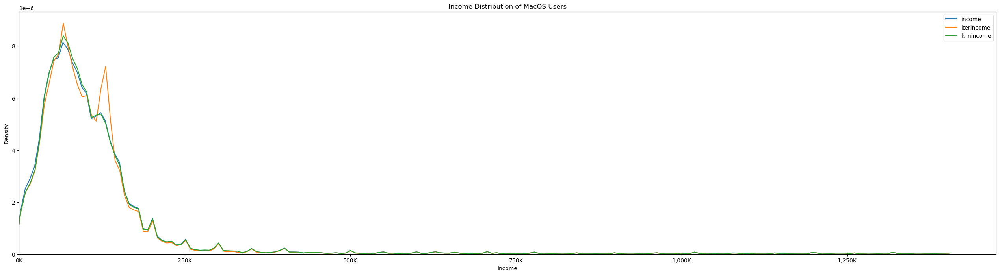

...

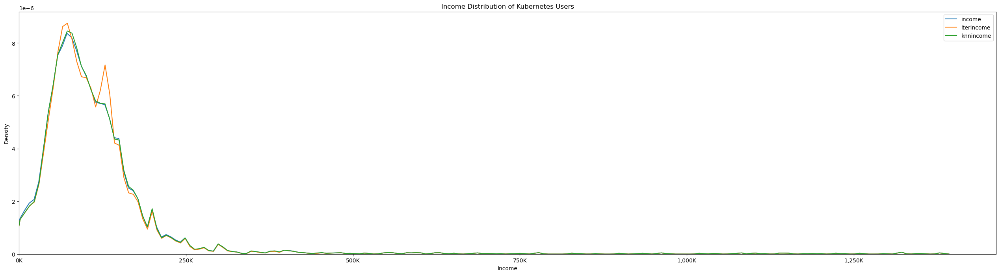

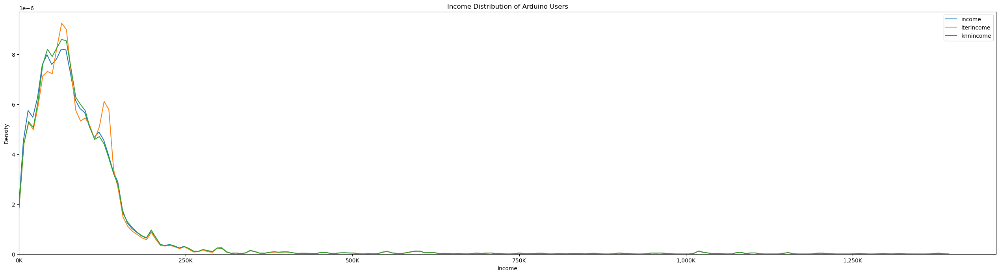

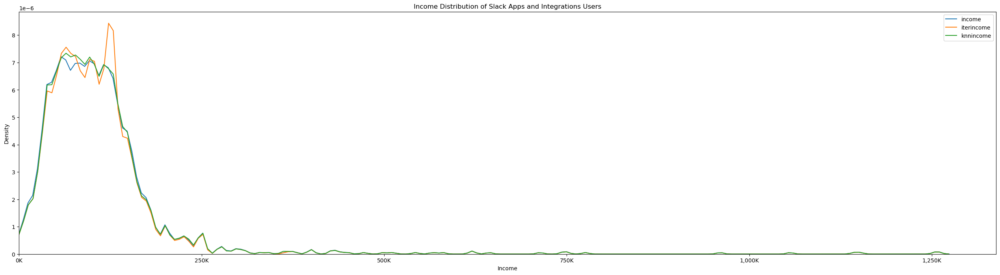

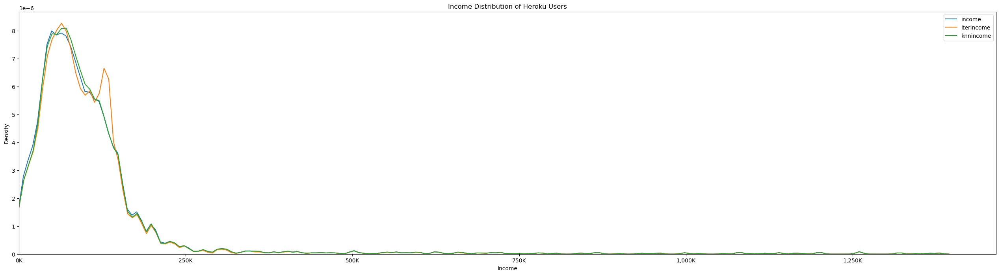

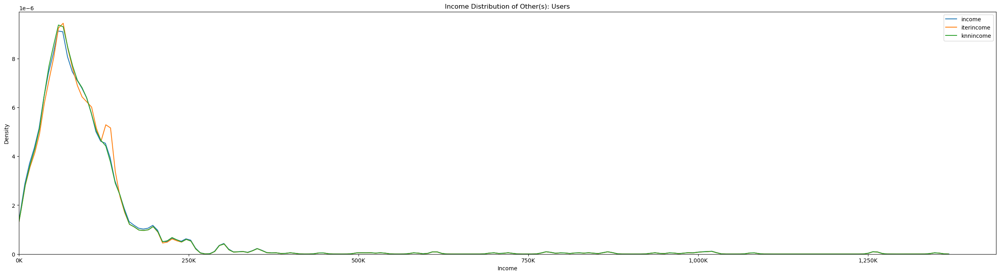

In [67]:
for platform in platform_unique:
    fig, ax = plt.subplots(figsize=(32, 8))

    platform_data = df[df['platform'].apply(lambda x: platform in x)]
    for column in income_columns:
        sns.kdeplot(data=platform_data, x=column, ax=ax, label=column, bw_adjust=0.2)

    ax.set_xlim(0, None)
    ax.set_ylim(0, None)
    ax.set_title(f'Income Distribution of {platform} Users')
    ax.set_xlabel('Income')
    ax.set_ylabel('Density')

    ax.xaxis.set_major_locator(MaxNLocator(6))
    formatter = FuncFormatter(lambda x, pos: f'{int(x/1000):,}K')
    ax.xaxis.set_major_formatter(formatter)

    ax.legend()

    plt.show()

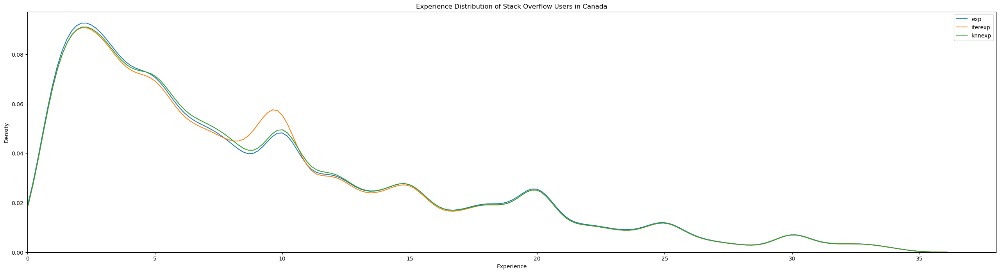

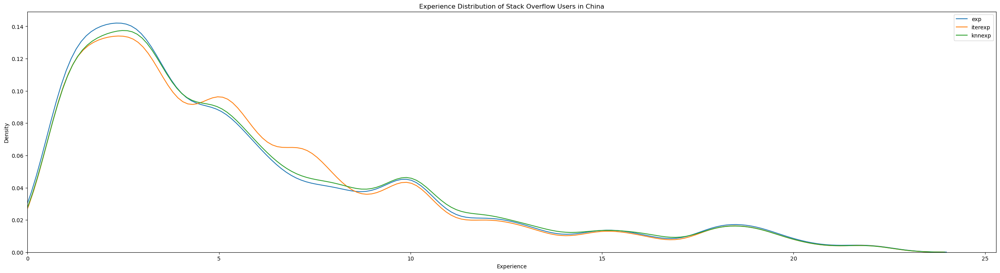

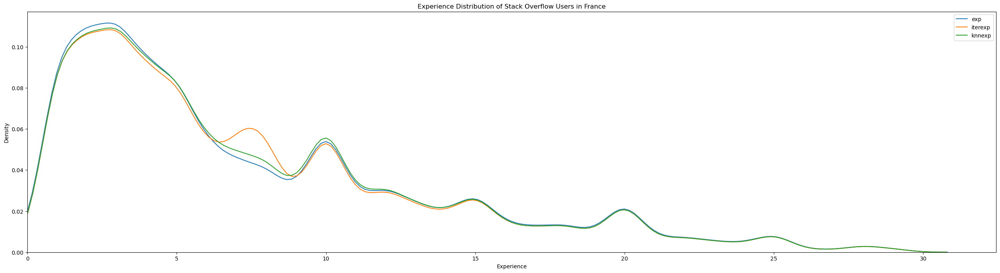

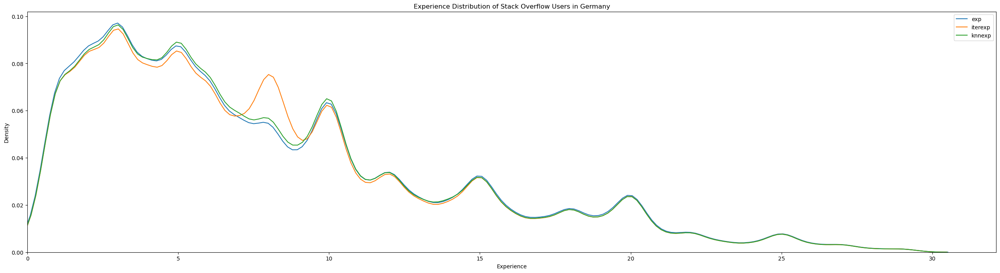

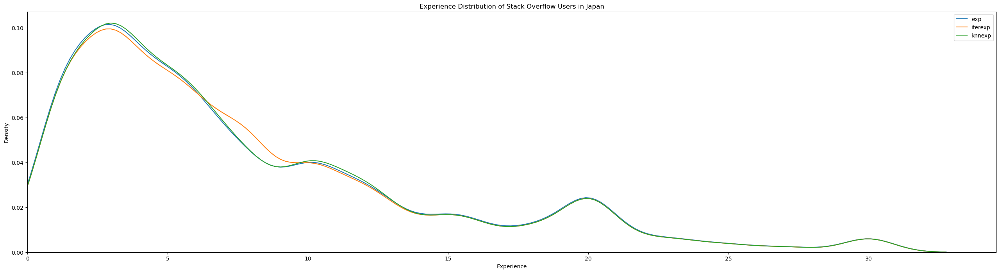

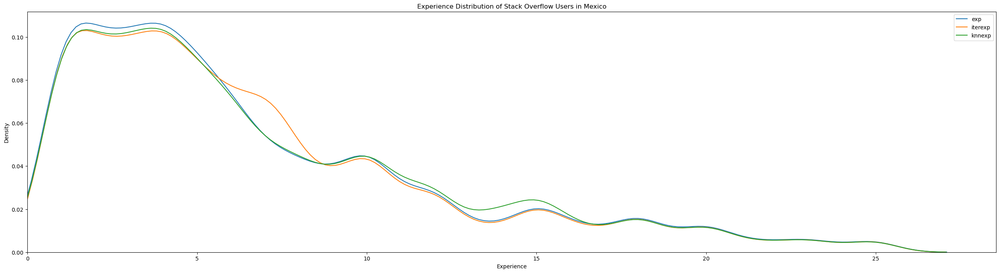

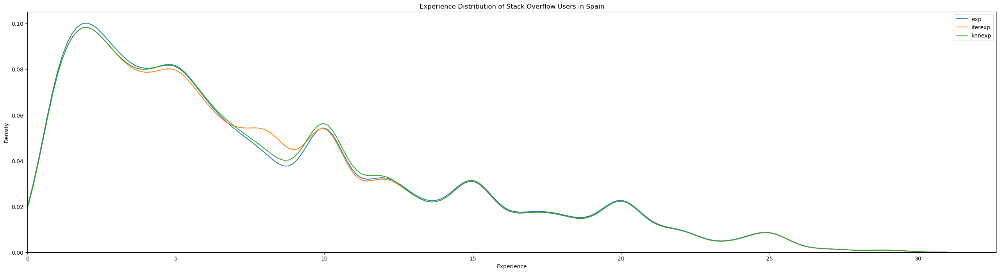

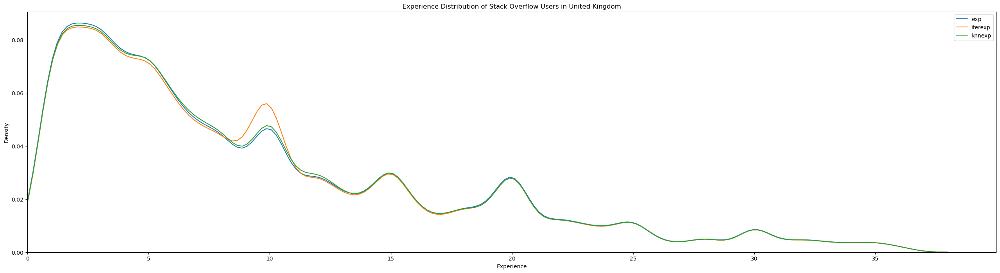

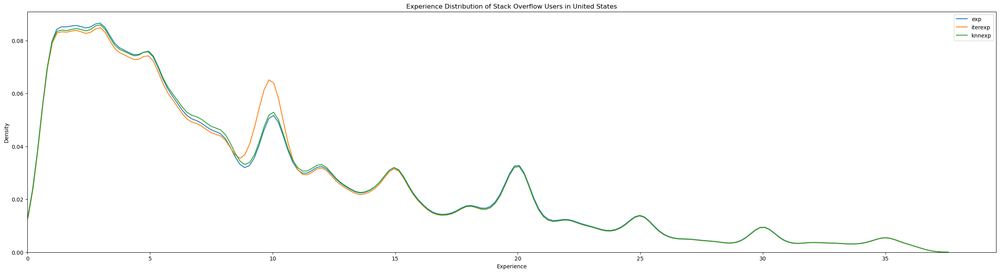

In [68]:
country_list = df['country'].unique().tolist()
for country in country_list:
    fig, ax = plt.subplots(figsize=(32, 8))

    country_data = df[df['country'] == country]
    for column in exp_columns:
        sns.kdeplot(data=country_data, x=column, ax=ax, label=column, bw_adjust=0.5)

    ax.set_xlim(0, None)
    ax.set_ylim(0, None)
    ax.set_title(f'Experience Distribution of Stack Overflow Users in {country}')
    ax.set_xlabel('Experience')
    ax.set_ylabel('Density')

    ax.legend()

    plt.show()

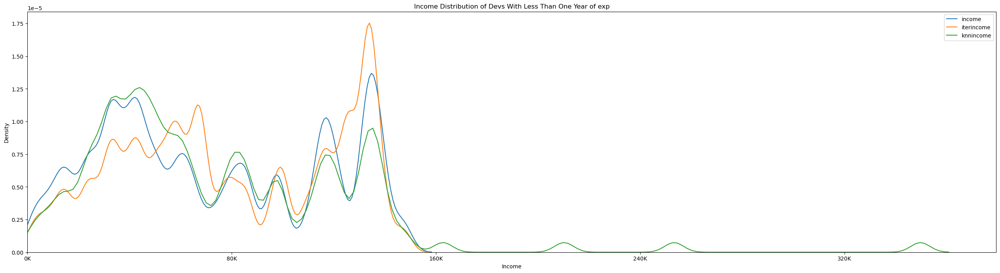

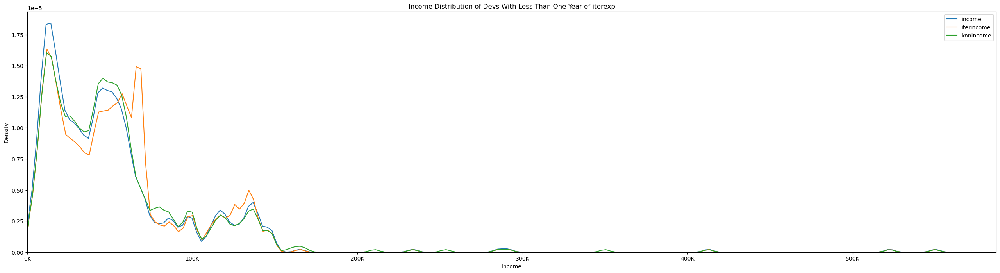

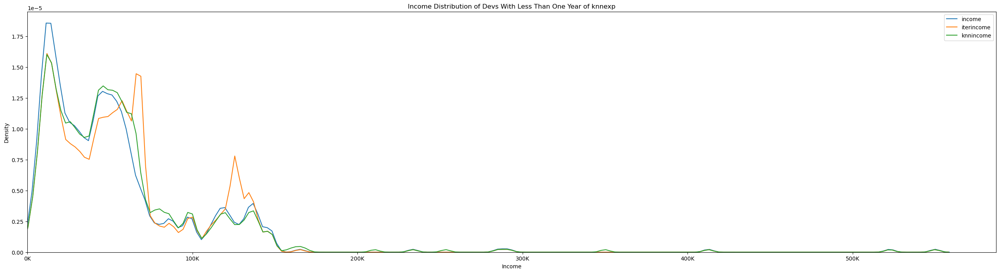

In [69]:
# i want to compare slices of experience. here i am looking at data where exp/iterexp/knnexp is less than 1
# i am purposefully not specifying == 0 because the imputed values are likely floats and not rounded
# integers
for exp_col in exp_columns:
    fig, ax = plt.subplots(figsize=(32, 8))

    experience_data = df[df[exp_col] < 1]
    for column in income_columns:
        sns.kdeplot(data=experience_data, x=column, ax=ax, label=column, bw_adjust=0.2)

    ax.set_xlim(0, None)
    ax.set_ylim(0, None)
    ax.set_title(f'Income Distribution of Devs With Less Than One Year of {exp_col}')
    ax.set_xlabel('Income')
    ax.set_ylabel('Density')

    ax.xaxis.set_major_locator(MaxNLocator(6))
    formatter = FuncFormatter(lambda x, pos: f'{int(x/1000):,}K')
    ax.xaxis.set_major_formatter(formatter)

    ax.legend()

    plt.show()

In [70]:
# the above charts are interesting, the original income band for exp < 1 seems to have had a maximum of
# about 160k, but the knnimputer has assigned some income outliers to this otherwise relatively contained spread
# but the iterativeimputer really stuck with the mean value as seems apparent in almost all of these charts

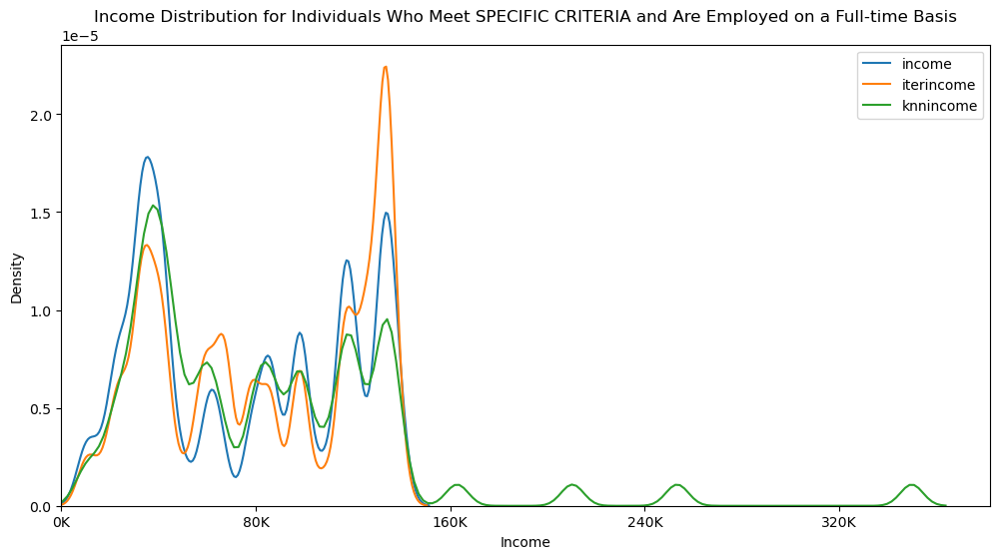

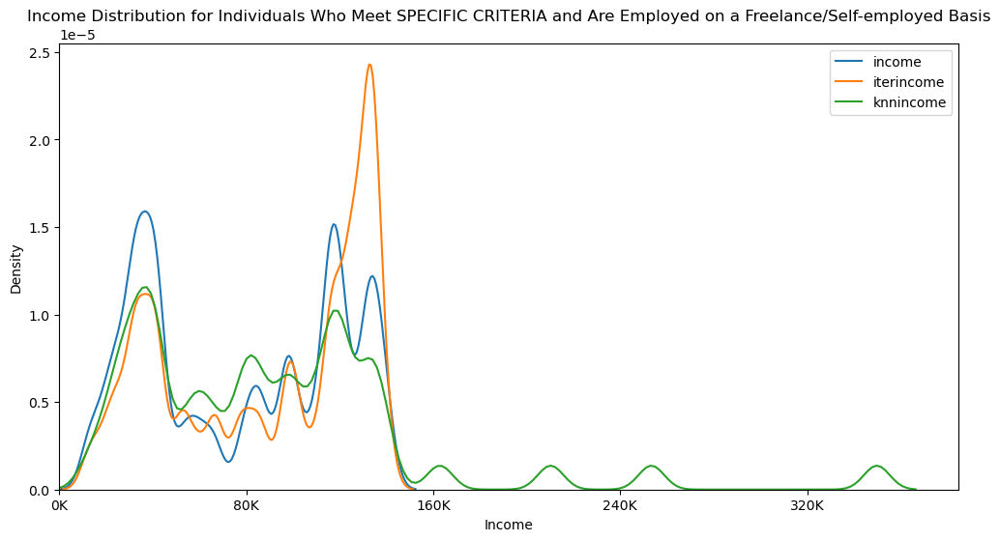

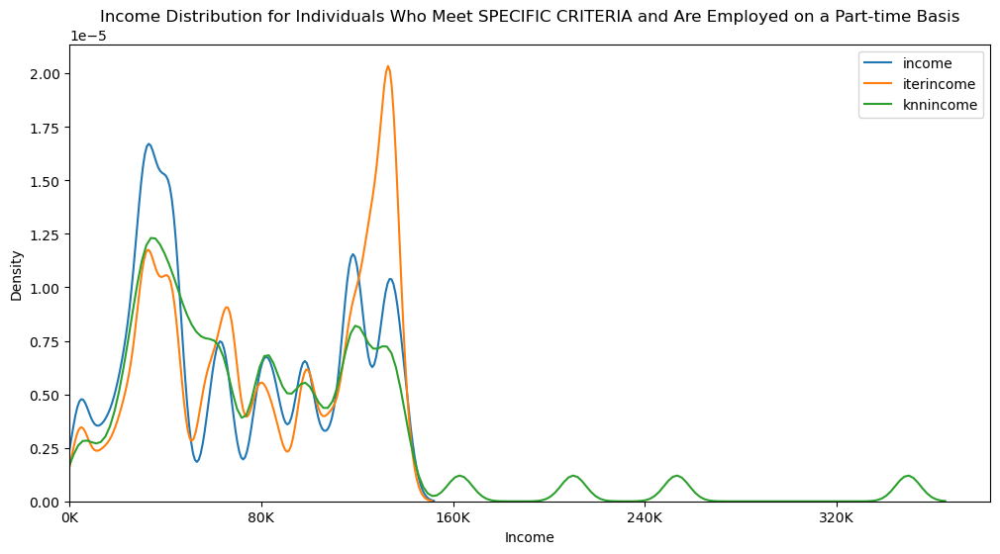

In [71]:
# creating a filtered chart so i can plot income distributions of groups that meet specific criteria

# i want to plot a chart for each positively-identified-as-employed-to-some-degree employment type
employment_list = df['employment'].unique().tolist()

# filter by country and undergrad
filter_country = 'United States'
filter_undergrad = 'Other Engineering'

# going to filter by below, currently including any row containing at least one from each list
filter_languages = ['Python', 'SQL']
filter_devtypes = ['Data or business analyst', 'Data scientist or machine learning specialist']

# max and min years of experience
exp_max = 1
exp_min = 0

for employment_status in employment_list:
    # filter by single labels
    employment_data = df[
        (df['employment'] == employment_status) |
        (df['country'] == filter_country) |
        (df['undergrad'] == filter_undergrad)
    ]
    # filter by multi labels
    filtered_data = employment_data[
        (employment_data['language'].apply(lambda x: any(lang in x for lang in filter_languages))) |
        (employment_data['devtype'].apply(lambda x: any(dev_type in x for dev_type in filter_devtypes)))
    ]

    filtered_data = filtered_data[(filtered_data['exp'] < exp_max) & (filtered_data['exp'] >= exp_min)]

    fig, ax = plt.subplots(figsize=(12, 6))

    for column in income_columns:
        sns.kdeplot(data=filtered_data, x=column, ax=ax, label=column, bw_adjust=0.2)

    ax.set_xlim(0, None)
    ax.set_ylim(0, None)
    ax.set_title(f'Income Distribution for Individuals Who Meet SPECIFIC CRITERIA and Are Employed on a {employment_status} Basis')
    ax.set_xlabel('Income')
    ax.set_ylabel('Density')

    ax.xaxis.set_major_locator(MaxNLocator(6))
    formatter = FuncFormatter(lambda x, pos: f'{int(x/1000):,}K')
    ax.xaxis.set_major_formatter(formatter)

    ax.legend()
    plt.show()

In [72]:
# ok so this sort of helps me figure out what a reasonable salary might be.